<a href="https://colab.research.google.com/github/srilamaiti/ai4i_analysis/blob/main/ai4i_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Business ask**
Determine the type of machine failure

# **Business impact**

Identifying the type of machine failure will help the engineering teams to schedule required maintainance ahead of time to avoid predictable downtime thus avoiding low productivity.

# **Installing new libraries**

In [ ]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 6.0 MB/s eta 0:00:00


In [ ]:
!pip install pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 10.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 11.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=9f6fd17f783c2332533a53d705dc514e3eee98e2ce4f7a49b09abdc076915c91
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


# **Importing libraries**

In [ ]:
# Generic processing and data wrangling, data exploration
import os
import numpy as np
import pandas as pd
import copy
import itertools

# Data profiling
from ydata_profiling import ProfileReport

# Data visulization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio

# Data distribution handling
from imblearn.over_sampling import SMOTENC
from sklearn.utils import class_weight

# Model
import lightgbm as lgb
from sklearn.metrics import fbeta_score
from sklearn.metrics import classification_report
from sklearn.decomposition import PCA
import xgboost as xgb
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.dummy import DummyClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
import umap
from sklearn.manifold import TSNE
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import fbeta_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import auc
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import confusion_matrix
import pickle
import mlxtend
from mlxtend.plotting import scatterplotmatrix
from mlxtend.plotting import heatmap
import tensorflow as tf
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import SVMSMOTE
from imblearn.over_sampling import RandomOverSampler
from random import sample
from numpy.random import uniform
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import scale
from sklearn.preprocessing import normalize
from sklearn.decomposition import KernelPCA
from sklearn.decomposition import IncrementalPCA
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.svm import SVC

# Warning handling
import warnings
warnings.filterwarnings('ignore')

# **Reading data**

## **Source dataset: https://www.kaggle.com/datasets/stephanmatzka/predictive-maintenance-dataset-ai4i-2020?resource=download**

About Dataset
Please note that this is the original dataset with additional information and proper attribution. There is at least one other version of this dataset on Kaggle that was uploaded without permission. Please be fair and attribute the original author.
This synthetic dataset is modeled after an existing milling machine and consists of 10 000 data points from a stored as rows with 14 features in columns

<li>UID: unique identifier ranging from 1 to 10000</li>
<li>product ID: consisting of a letter L, M, or H for low (50% of all products), medium (30%) and high (20%) as product quality variants and a variant-specific serial number</li>
<li>type: just the product type L, M or H from column 2</li>
<li>air temperature [K]: generated using a random walk process later normalized to a standard deviation of 2 K around 300 K</li>
<li>process temperature [K]: generated using a random walk process normalized to a standard deviation of 1 K, added to the air temperature plus 10 K.</li>
<li>rotational speed [rpm]: calculated from a power of 2860 W, overlaid with a normally distributed noise</li>
<li>torque [Nm]: torque values are normally distributed around 40 Nm with a SD = 10 Nm and no negative values.</li>
<li>tool wear [min]: The quality variants H/M/L add 5/3/2 minutes of tool wear to the used tool in the process.</li>
<li>a 'machine failure' label that indicates, whether the machine has failed in this particular datapoint for any of the following failure modes are true.</li>

The machine failure consists of five independent failure modes

<li>tool wear failure (TWF): the tool will be replaced of fail at a randomly selected tool wear time between 200 - 240 mins (120 times in our dataset). At this point in time, the tool is replaced 69 times, and fails 51 times (randomly assigned).</li>
<li>heat dissipation failure (HDF): heat dissipation causes a process failure, if the difference between air- and process temperature is below 8.6 K and the tools rotational speed is below 1380 rpm. This is the case for 115 data points.</li>
<li>power failure (PWF): the product of torque and rotational speed (in rad/s) equals the power required for the process. If this power is below 3500 W or above 9000 W, the process fails, which is the case 95 times in our dataset.</li>
<li>overstrain failure (OSF): if the product of tool wear and torque exceeds 11,000 minNm for the L product variant (12,000 M, 13,000 H), the process fails due to overstrain. This is true for 98 datapoints.</li>
<li>random failures (RNF): each process has a chance of 0,1 % to fail regardless of its process parameters. This is the case for only 5 datapoints, less than could be expected for 10,000 datapoints in our dataset.</li>

If at least one of the above failure modes is true, the process fails and the 'machine failure' label is set to 1. It is therefore not transparent to the machine learning method, which of the failure modes has caused the process to fail.
This dataset is part of the following publication, please cite when using this dataset:
S. Matzka, "Explainable Artificial Intelligence for Predictive Maintenance Applications," 2020 Third International Conference on Artificial Intelligence for Industries (AI4I), 2020, pp. 69-74, doi: 10.1109/AI4I49448.2020.00023.

The image of the milling process is the work of Daniel Smyth @ Pexels: https://www.pexels.com/de-de/foto/industrie-herstellung-maschine-werkzeug-10406128/

In [ ]:
df = pd.read_csv("ai4i2020.csv")
df.columns = [col.lower().replace("[","_").replace("]","").replace(" ","") for col in df.columns]
orig_df = copy.deepcopy(df)
df.columns

Index(['udi', 'productid', 'type', 'airtemperature_k', 'processtemperature_k',
       'rotationalspeed_rpm', 'torque_nm', 'toolwear_min', 'machinefailure',
       'twf', 'hdf', 'pwf', 'osf', 'rnf'],
      dtype='object')

# **EDA**

In [ ]:
# Dataframe row and column count
df.shape

(10000, 14)

In [ ]:
fact_cols = ['airtemperature_k',
             'processtemperature_k',
             'rotationalspeed_rpm',
             'torque_nm',
             'toolwear_min'
            ]
error_columns = ['twf', 'hdf',	'pwf',	'osf', 'rnf']

In [ ]:
# Check top few records of the dataframe
df.head()

,udi,productid,type,airtemperature_k,processtemperature_k,rotationalspeed_rpm,torque_nm,toolwear_min,machinefailure,twf,hdf,pwf,osf,rnf
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


In [ ]:
# Check the bottom few records of the dataframe
df.tail()

,udi,productid,type,airtemperature_k,processtemperature_k,rotationalspeed_rpm,torque_nm,toolwear_min,machinefailure,twf,hdf,pwf,osf,rnf
9995,9996,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0
9996,9997,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0
9997,9998,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0
9998,9999,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0
9999,10000,M24859,M,299.0,308.7,1500,40.2,30,0,0,0,0,0,0


In [ ]:
# Chaecking the dataframe structure
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   udi                   10000 non-null  int64  
 1   productid             10000 non-null  object 
 2   type                  10000 non-null  object 
 3   airtemperature_k      10000 non-null  float64
 4   processtemperature_k  10000 non-null  float64
 5   rotationalspeed_rpm   10000 non-null  int64  
 6   torque_nm             10000 non-null  float64
 7   toolwear_min          10000 non-null  int64  
 8   machinefailure        10000 non-null  int64  
 9   twf                   10000 non-null  int64  
 10  hdf                   10000 non-null  int64  
 11  pwf                   10000 non-null  int64  
 12  osf                   10000 non-null  int64  
 13  rnf                   10000 non-null  int64  
dtypes: float64(3), int64(9), object(2)
memory usage: 1.1+ MB


In [ ]:
# Analyzing the numeric values
df.describe().T

,count,mean,std,min,25%,50%,75%,max
udi,10000.0,5000.50000,2886.895680,1.0,2500.75,5000.5,7500.25,10000.0
airtemperature_k,10000.0,300.00493,2.000259,295.3,298.30,300.1,301.50,304.5
processtemperature_k,10000.0,310.00556,1.483734,305.7,308.80,310.1,311.10,313.8
rotationalspeed_rpm,10000.0,1538.77610,179.284096,1168.0,1423.00,1503.0,1612.00,2886.0
torque_nm,10000.0,39.98691,9.968934,3.8,33.20,40.1,46.80,76.6
toolwear_min,10000.0,107.95100,63.654147,0.0,53.00,108.0,162.00,253.0
machinefailure,10000.0,0.03390,0.180981,0.0,0.00,0.0,0.00,1.0
twf,10000.0,0.00460,0.067671,0.0,0.00,0.0,0.00,1.0
hdf,10000.0,0.01150,0.106625,0.0,0.00,0.0,0.00,1.0
pwf,10000.0,0.00950,0.097009,0.0,0.00,0.0,0.00,1.0


Based on the mean and median value, we see rotationalspeed_rpm,
Based on the mean and median value, we see rotationalspeed_rpm and toolwear_min have outliers.

In [ ]:
# Verify if the data has duplicate values
duplicate_records_count = df.duplicated().sum()
print(f"Duplicate records count: {duplicate_records_count}")

Duplicate records count: 0


In [ ]:
# Verify if the data has missing values
null_records_count = df.isnull().sum().sum()
print(f"Records with missing values count: {null_records_count}")

Records with missing values count: 0


In [ ]:
# Verifying the data distribution of the target column
df_failure_stat = df.machinefailure.value_counts().reset_index()
df_failure_stat['pct'] = np.round(100 * df_failure_stat['count'] / len(df), 2)
df_failure_stat

,machinefailure,count,pct
0,0,9661,96.61
1,1,339,3.39


Based on the data distrution, it shows the data is highly impbalanced, while most of the records (97%) show that there is no machine failure, there are small number of failure records (3%) as well.

In [ ]:
# Checking the data distribution of each failure types
df[error_columns].value_counts().reset_index()

,twf,hdf,pwf,osf,rnf,count
0,0,0,0,0,0,9652
1,0,1,0,0,0,106
2,0,0,1,0,0,80
3,0,0,0,1,0,78
4,1,0,0,0,0,42
5,0,0,0,0,1,18
6,0,0,1,1,0,11
7,0,1,0,1,0,6
8,0,1,1,0,0,3
9,1,0,0,1,0,2


Based on the data distribution of machinefailure, we see 9661 records do not have failures, all though based on individual error column sum, it shows 9652 records are error free. As the later data are more granular, we will rely on these columns more and update machinefailure column based on the sum of individual error columns.

In [ ]:
df['failure_count'] = df['twf'] + df['hdf'] + df['pwf'] + df['osf'] + df['rnf']
#df['no_failure_flag'] = np.where(df['failure_count'] == 0, 1, 0)
# Checking the data distribution of no_failure_flag
#df[['no_failure_flag']].value_counts().reset_index()

In [ ]:
def show_viz(col, df = df):
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(data=df, x=col)
    plt.title(f'Proportion of {col}')
    plt.xlabel(f'Distinct {col}')
    plt.ylabel('Count')

    # Add as percentages as labels
    total = len(df[col])
    for p in ax.patches:
        height = p.get_height()
        percentage = (height / total) * 100
        ax.annotate(f'{percentage:.2f}%',
                      (p.get_x() + p.get_width() / 2,
                       height),
                       ha='center',
                       va='bottom')

    plt.show()

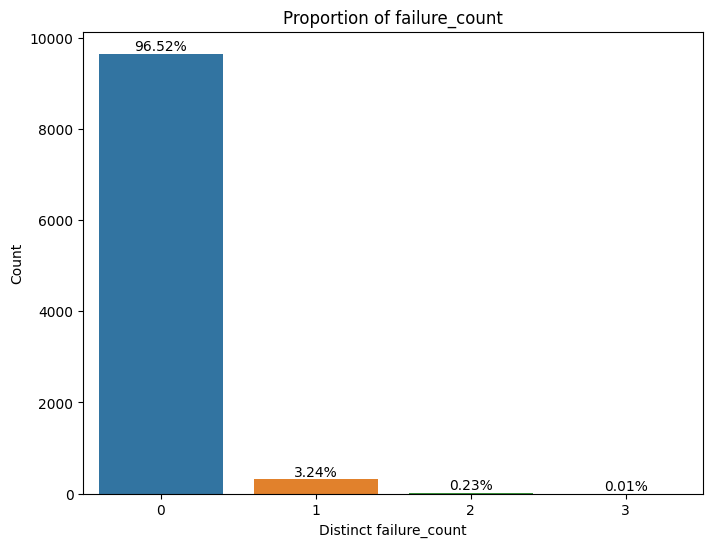

In [ ]:
show_viz(col = 'failure_count')

We are assuming that the failures are mutually exclusive and also mixed failures are relatively small. So we are reducing those records where we have multiple failure types.

In [ ]:
df = df[df.failure_count <= 1]

In [ ]:
df['machinefailure'] = np.where(df['failure_count'] >=1, 1, 0)
# Verifying the data distribution of the target column
df_failure_stat = df.machinefailure.value_counts().reset_index()
df_failure_stat['pct'] = np.round(100 * df_failure_stat['count'] / len(df), 2)
df_failure_stat

,machinefailure,count,pct
0,0,9652,96.75
1,1,324,3.25


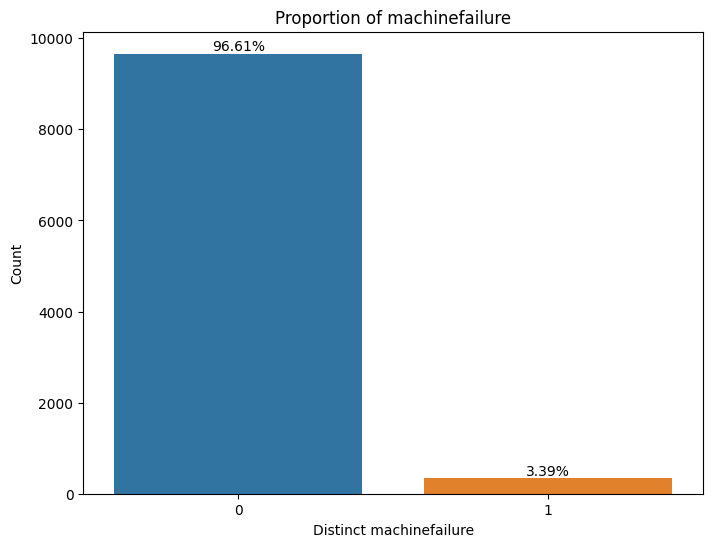

In [ ]:
show_viz(col = 'machinefailure')

In [ ]:
# Checking distribution of product type
df['type'].value_counts().reset_index()

,type,count
0,L,5983
1,M,2991
2,H,1002


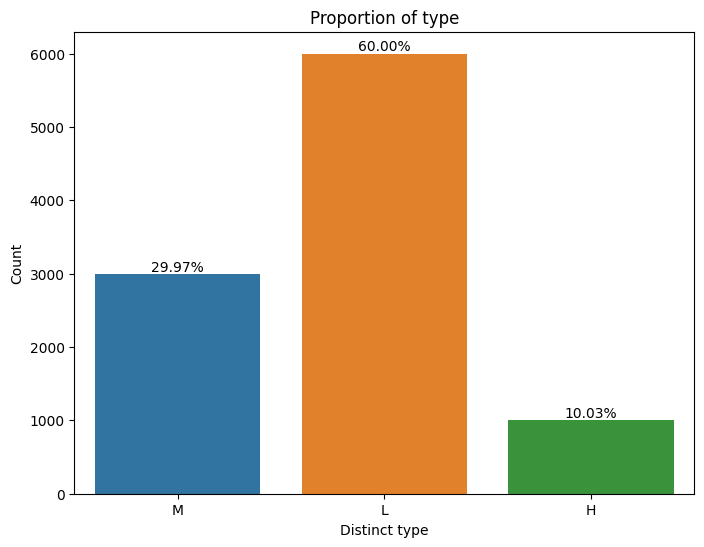

In [ ]:
show_viz(col = 'type')

In [ ]:
# Checking distribution of product type and machinefailure together
df[['type', 'machinefailure']].value_counts().reset_index()

,type,machinefailure,count
0,L,0,5757
1,M,0,2916
2,H,0,979
3,L,1,226
4,M,1,75
5,H,1,23


As we see that, more failures happen for low end machines compared to medium and high end machines. As expected, high end machine has lowest number of machine failures.

In [ ]:
# Checking distribution of product type and failure count together, for error records
df[df.machinefailure == 1][['type', 'failure_count']].value_counts().reset_index()

,type,failure_count,count
0,L,1,226
1,M,1,75
2,H,1,23


Surprisingly, one high end machine has mor than 2 failures.

In [ ]:
combination_list = []
conditions = []
for x in map(''.join, itertools.product('01', repeat=5)):
    combination_list.append(x)

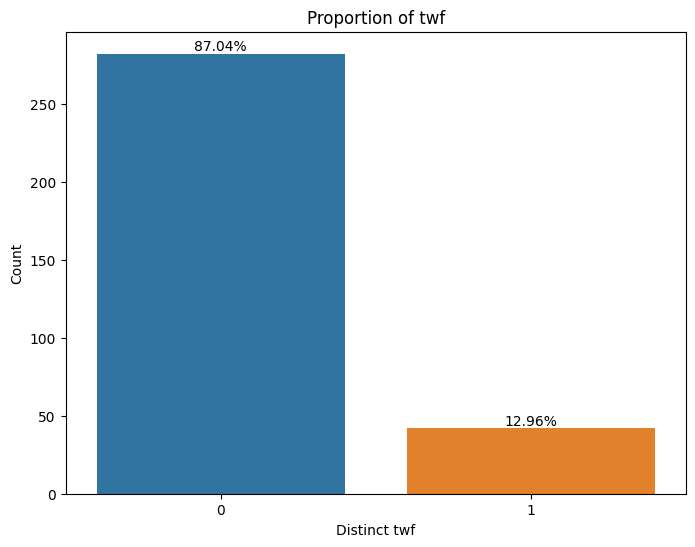

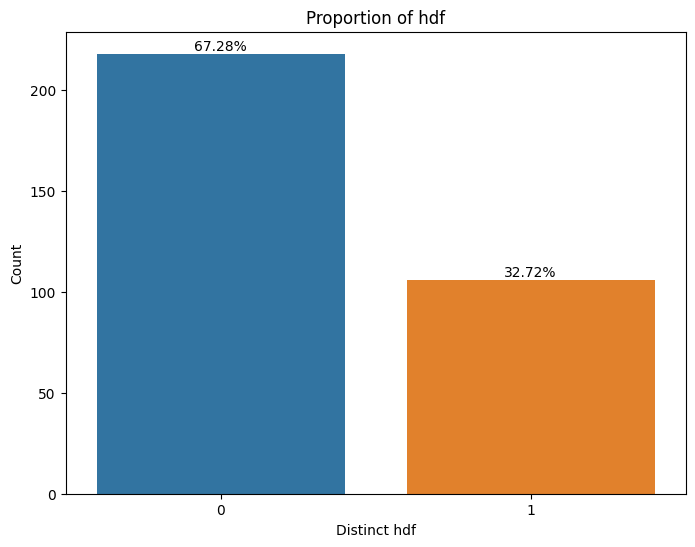

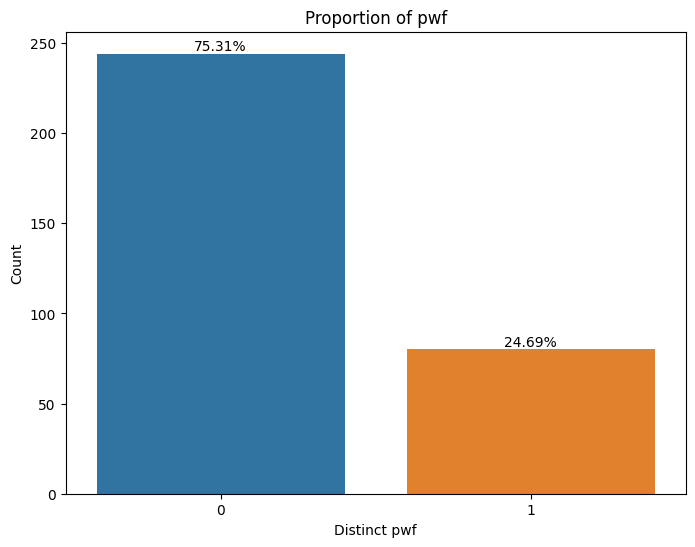

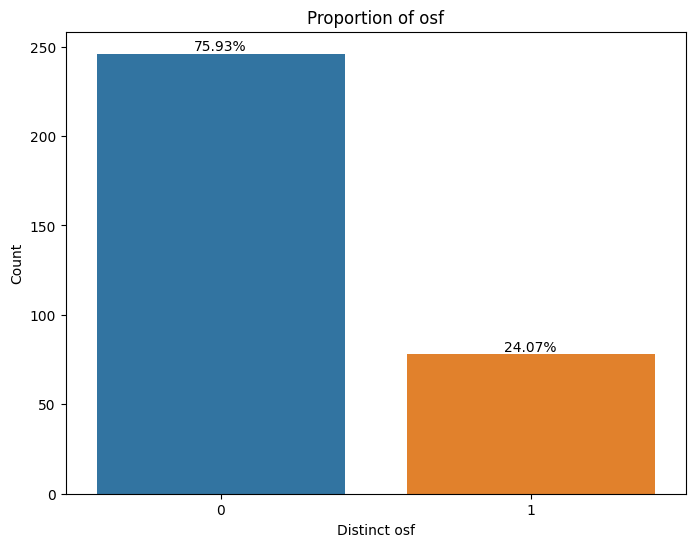

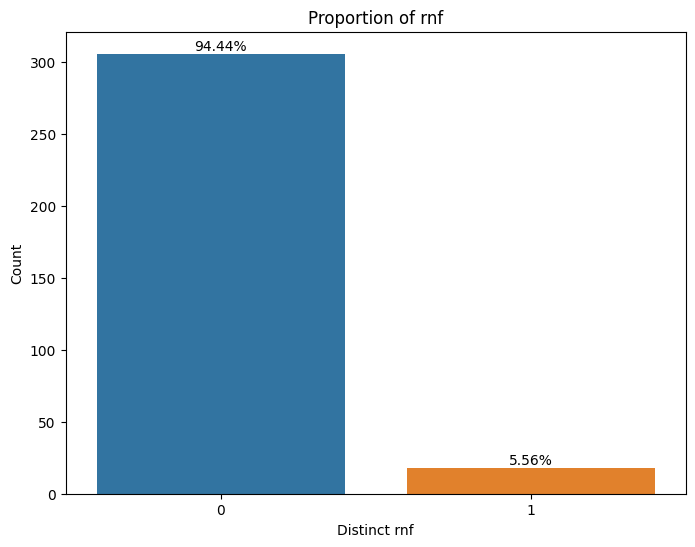

In [ ]:
for col in error_columns:
    show_viz(col = col, df = df[df.machinefailure == 1])

We see HDF related failure is highest followed by OSF and PWF failure.

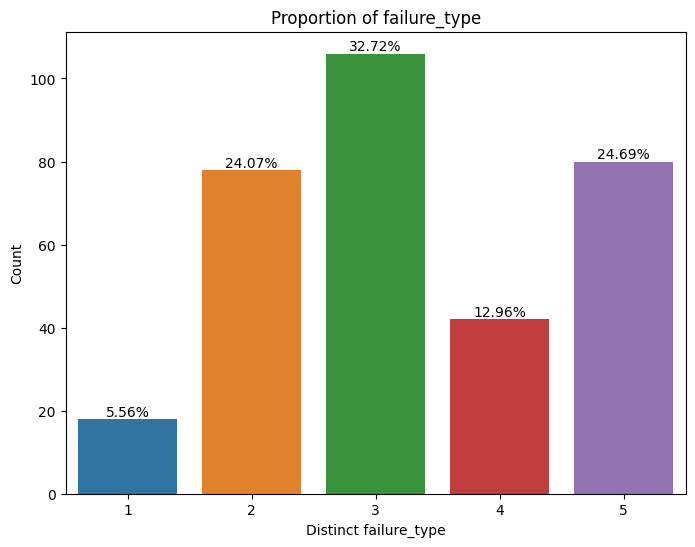

In [ ]:
# Assigning failure type
'''
conditions = [
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 0), #0,  no err
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 1), #1,  rmf err
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 1) & (df['rnf'] == 0), #2,  osf err
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 1) & (df['rnf'] == 1), #3,  rnf, osf err
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 1) & (df['osf'] == 0) & (df['rnf'] == 0), #4,  pwf err
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 1) & (df['osf'] == 0) & (df['rnf'] == 1), #5,  pwf, rnf err
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 1) & (df['osf'] == 1) & (df['rnf'] == 0), #6,  pwf, osf err
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 1) & (df['osf'] == 1) & (df['rnf'] == 1), #7,  pwf, osf, rnf err
    (df['twf'] == 0) & (df['hdf'] == 1) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 0), #8,  hdf err
    (df['twf'] == 0) & (df['hdf'] == 1) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 1), #9,  hdf, rnf err
    (df['twf'] == 0) & (df['hdf'] == 1) & (df['pwf'] == 0) & (df['osf'] == 1) & (df['rnf'] == 0), #10, hdf, osf err
    (df['twf'] == 0) & (df['hdf'] == 1) & (df['pwf'] == 0) & (df['osf'] == 1) & (df['rnf'] == 1), #11, hdf, osf, rnf err
    (df['twf'] == 0) & (df['hdf'] == 1) & (df['pwf'] == 1) & (df['osf'] == 0) & (df['rnf'] == 0), #12, hdf, pwf err
    (df['twf'] == 0) & (df['hdf'] == 1) & (df['pwf'] == 1) & (df['osf'] == 0) & (df['rnf'] == 1), #13, hdf, pwf, rnf err
    (df['twf'] == 0) & (df['hdf'] == 1) & (df['pwf'] == 1) & (df['osf'] == 1) & (df['rnf'] == 0), #14, hdf, pwf, osf err
    (df['twf'] == 0) & (df['hdf'] == 1) & (df['pwf'] == 1) & (df['osf'] == 1) & (df['rnf'] == 1), #15, hdf, pwf, psf, rnf err

    (df['twf'] == 1) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 0), #16, twf err
    (df['twf'] == 1) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 1), #17, twf, rnf err
    (df['twf'] == 1) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 1) & (df['rnf'] == 0), #18, twf, osf err
    (df['twf'] == 1) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 1) & (df['rnf'] == 1), #19, twf, osf, rnf err
    (df['twf'] == 1) & (df['hdf'] == 0) & (df['pwf'] == 1) & (df['osf'] == 0) & (df['rnf'] == 0), #20, twf, pwf err
    (df['twf'] == 1) & (df['hdf'] == 0) & (df['pwf'] == 1) & (df['osf'] == 0) & (df['rnf'] == 1), #21, twf, pwf, rnf err
    (df['twf'] == 1) & (df['hdf'] == 0) & (df['pwf'] == 1) & (df['osf'] == 1) & (df['rnf'] == 0), #22, twf, pwf, psf err
    (df['twf'] == 1) & (df['hdf'] == 0) & (df['pwf'] == 1) & (df['osf'] == 1) & (df['rnf'] == 1), #23, twf, pwf err
    (df['twf'] == 1) & (df['hdf'] == 1) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 0), #24, twf, hdf err
    (df['twf'] == 1) & (df['hdf'] == 1) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 1), #25, twf, hdf, rnf err
    (df['twf'] == 1) & (df['hdf'] == 1) & (df['pwf'] == 0) & (df['osf'] == 1) & (df['rnf'] == 0), #26, twf, hdf, osf err
    (df['twf'] == 1) & (df['hdf'] == 1) & (df['pwf'] == 0) & (df['osf'] == 1) & (df['rnf'] == 1), #27, twf, hdf, osf, rnf err
    (df['twf'] == 1) & (df['hdf'] == 1) & (df['pwf'] == 1) & (df['osf'] == 0) & (df['rnf'] == 0), #28, twf, hdf, pwf err
    (df['twf'] == 1) & (df['hdf'] == 1) & (df['pwf'] == 1) & (df['osf'] == 0) & (df['rnf'] == 1), #29, twf, hdf, pwf, rnf err
    (df['twf'] == 1) & (df['hdf'] == 1) & (df['pwf'] == 1) & (df['osf'] == 1) & (df['rnf'] == 0), #30, twf, hdf, pwf, osf err
    (df['twf'] == 1) & (df['hdf'] == 1) & (df['pwf'] == 1) & (df['osf'] == 1) & (df['rnf'] == 1)  #31, twf, hdf, pwf, osf, rnf err
]

choices = [idx for idx, c in enumerate(combination_list)]
'''
conditions = [
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 0), #0,  no err
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 1), #1,  rmf err
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 1) & (df['rnf'] == 0), #2,  osf err
    (df['twf'] == 0) & (df['hdf'] == 1) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 0), #3,  hdf err
    (df['twf'] == 1) & (df['hdf'] == 0) & (df['pwf'] == 0) & (df['osf'] == 0) & (df['rnf'] == 0), #4,  twf err
    (df['twf'] == 0) & (df['hdf'] == 0) & (df['pwf'] == 1) & (df['osf'] == 0) & (df['rnf'] == 0)  #5,  pwf err
    ]

choices = [0, 1, 2, 3, 4, 5]
df['failure_type'] = np.select(conditions, choices, default=np.nan)
df['failure_type'] = df['failure_type'].apply(lambda x : int(x))

show_viz(col = 'failure_type', df = df[df.failure_count == 1])

Out of multiple failure scenarios, PWF and OSF failures together are highest.

In [ ]:
# Data profiling
profile = ProfileReport(df,
                        title="Predictive maintenance based on IoT data",
                        dataset={"copyright_holder": "Stephan Matzka"
                                },
                        explorative=True,
                       )
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

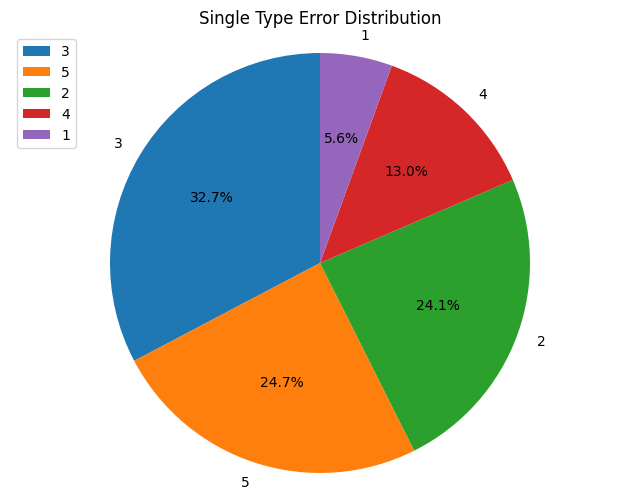

In [ ]:
proportions = df[(df.machinefailure == 1)]['failure_type'].value_counts(normalize=True)

plt.figure(figsize=(8, 6))
plt.pie(proportions, labels=proportions.index, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Single Type Error Distribution')
plt.legend(loc="upper left")
plt.show()

We see that for the error records, rotationalspeed, torque and toolwear values are skewed across all high, medium and low product types.

In [ ]:
'''
df[(df.machinefailure == 1)].groupby(['type']).agg({"airtemperature_k": [np.min, np.mean, np.median, np.std, np.max],
                                                    "processtemperature_k": [np.min, np.mean, np.median, np.std, np.max],
                                                    "rotationalspeed_rpm": [np.min, np.mean, np.median, np.std, np.max],
                                                    "torque_nm": [np.min, np.mean, np.median, np.std, np.max],
                                                    "toolwear_min": [np.min, np.mean, np.median, np.std, np.max]
                                                    }
                                                   ).T
df[(df.machinefailure == 0)].groupby(['type']).agg({"airtemperature_k": [np.min, np.mean, np.median, np.std, np.max],
                                                    "processtemperature_k": [np.min, np.mean, np.median, np.std, np.max],
                                                    "rotationalspeed_rpm": [np.min, np.mean, np.median, np.std, np.max],
                                                    "torque_nm": [np.min, np.mean, np.median, np.std, np.max],
                                                    "toolwear_min": [np.min, np.mean, np.median, np.std, np.max]
                                                    }
                                                   ).T
'''

'\ndf[(df.machinefailure == 1)].groupby([\'type\']).agg({"airtemperature_k": [np.min, np.mean, np.median, np.std, np.max],\n                                                    "processtemperature_k": [np.min, np.mean, np.median, np.std, np.max],\n                                                    "rotationalspeed_rpm": [np.min, np.mean, np.median, np.std, np.max],\n                                                    "torque_nm": [np.min, np.mean, np.median, np.std, np.max],\n                                                    "toolwear_min": [np.min, np.mean, np.median, np.std, np.max]\n                                                    }\n                                                   ).T\ndf[(df.machinefailure == 0)].groupby([\'type\']).agg({"airtemperature_k": [np.min, np.mean, np.median, np.std, np.max],\n                                                    "processtemperature_k": [np.min, np.mean, np.median, np.std, np.max],\n                                                  

Here we see for non-error records, only rotationalspeed rpm values are skewed mostly, We see slight skewness in torque and toolwear values.

In [ ]:
df.groupby(['machinefailure', 'type'])[fact_cols].describe().T

machinefailure                        0                            \
type                                  H            L            M   
airtemperature_k     count   979.000000  5757.000000  2916.000000   
                     mean    299.834423   299.982717   299.999863   
                     std       2.010766     1.977699     2.009055   
                     min     295.500000   295.300000   295.300000   
                     25%     298.200000   298.300000   298.300000   
                     50%     299.700000   300.100000   300.100000   
                     75%     301.250000   301.400000   301.500000   
                     max     304.200000   304.500000   304.400000   
processtemperature_k count   979.000000  5757.000000  2916.000000   
                     mean    309.914402   310.000017   310.009979   
                     std       1.485646     1.478730     1.500936   
                     min     305.900000   305.700000   305.700000   
                     25%     308.750000   308.800000   308.900000   
                     50%     309.900000   310.100000   310.000000   
                     75%     311.000000   311.000000   311.100000   
                     max     313.500000   313.800000   313.800000   
rotationalspeed_rpm  count   979.000000  5757.000000  2916.000000   
                     mean   1540.232891  1541.947195  1537.151235   
                     std     170.040068   167.599864   166.261335   
                     min    1212.000000  1192.000000  1168.000000   
                     25%    1428.000000  1430.000000  1425.000000   
                     50%    1502.000000  1508.000000  1506.000000   
                     75%    1615.000000  1616.000000  1612.000000   
                     max    2636.000000  2695.000000  2456.000000   
torque_nm            count   979.000000  5757.000000  2916.000000   
                     mean     39.601124    39.544120    39.790432   
                     std       9.405501     9.439721     9.548366   
                     min      12.800000    12.600000    13.800000   
                     25%      32.750000    33.000000    33.200000   
                     50%      40.200000    39.700000    40.000000   
                     75%      46.200000    46.300000    46.400000   
                     max      67.900000    70.000000    67.300000   
toolwear_min         count   979.000000  5757.000000  2916.000000   
                     mean    106.781410   106.682300   106.637860   
                     std      62.549230    63.142184    62.673237   
                     min       0.000000     0.000000     0.000000   
                     25%      53.000000    52.000000    52.000000   
                     50%     106.000000   107.000000   105.000000   
                     75%     160.000000   160.000000   161.000000   
                     max     240.000000   246.000000   241.000000   

machinefailure                        1                            
type                                  H            L            M  
airtemperature_k     count    23.000000   226.000000    75.000000  
                     mean    301.217391   300.763274   301.166667  
                     std       2.111366     2.066414     1.995287  
                     min     296.600000   295.600000   295.800000  
                     25%     300.400000   299.025000   300.200000  
                     50%     302.000000   301.100000   302.000000  
                     75%     302.700000   302.475000   302.600000  
                     max     304.000000   304.400000   303.900000  
processtemperature_k count    23.000000   226.000000    75.000000  
                     mean    310.395652   310.310619   310.341333  
                     std       1.634425     1.375394     1.359759  
                     min     307.400000   306.100000   306.300000  
                     25%     309.800000   309.500000   309.650000  
                     50%     310.500000   310.500000   310.600000  
             

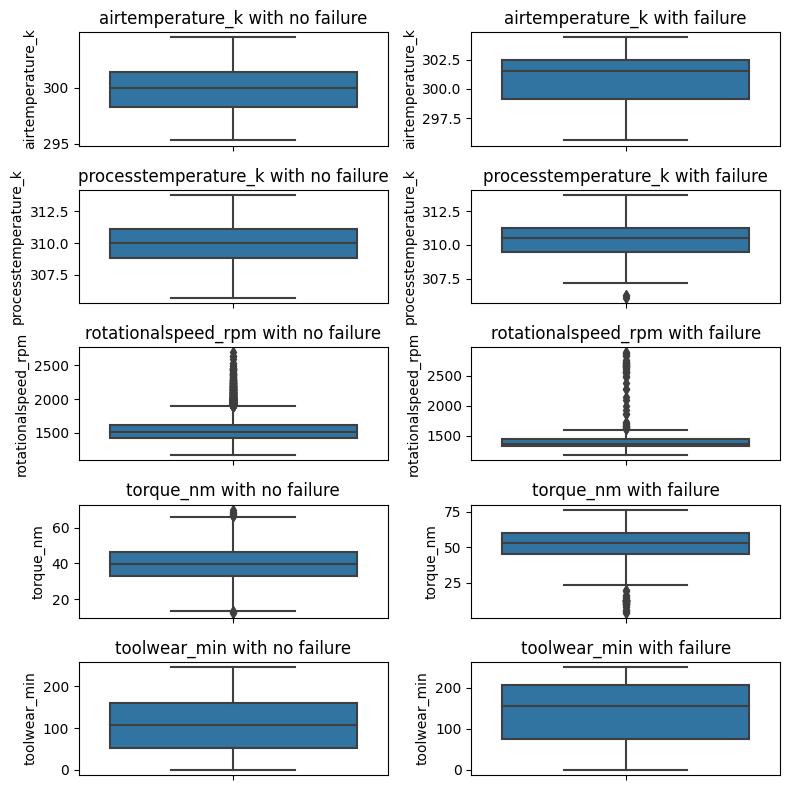

In [ ]:
# Create the figure and axess
fig, axes = plt.subplots(nrows=len(fact_cols), ncols=2 , figsize=(8, 8))

# Plot boxplot side by side
for i, feature in enumerate(fact_cols):
    sns.boxplot(data=df[df.machinefailure == 0], y=feature, ax=axes[i, 0])
    axes[i, 0].set_title(f'{feature} with no failure')

    sns.boxplot(data=df[df.machinefailure == 1], y=feature, ax=axes[i, 1])
    axes[i, 1].set_title(f'{feature} with failure')

# Adjust subplot
plt.tight_layout()

# Show boxplots
plt.show()

In [ ]:
'''
for fcol in fact_cols:
    g = sns.FacetGrid(df, col="machinefailure", height=4, aspect=.8)
    g.map(sns.barplot, "machinefailure", fcol);
    plt.show(block = False)
'''

'\nfor fcol in fact_cols:\n    g = sns.FacetGrid(df, col="machinefailure", height=4, aspect=.8)\n    g.map(sns.barplot, "machinefailure", fcol);\n    plt.show(block = False)\n'

<Axes: >

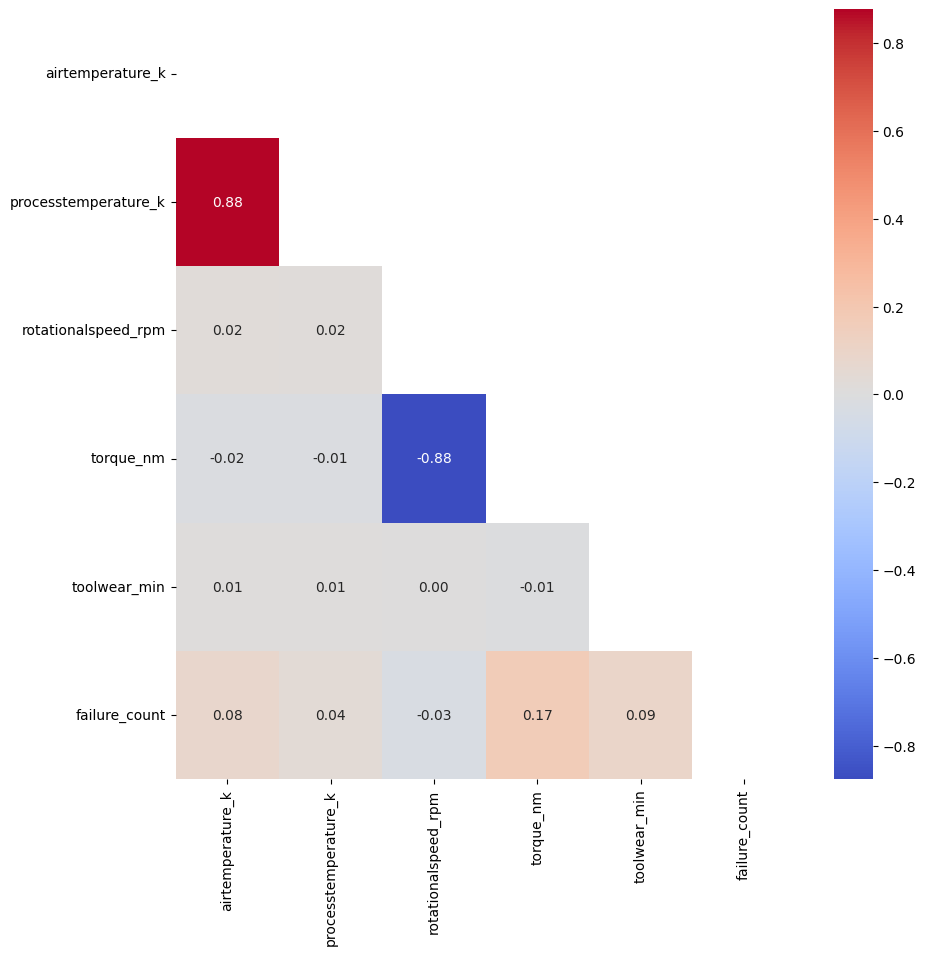

In [ ]:
# Plot correlation of numeric values applying mask
corr = df[['airtemperature_k', 'processtemperature_k',
       'rotationalspeed_rpm', 'torque_nm', 'toolwear_min','failure_count']].corr()
plt.figure(figsize = (10,10))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot = True, mask=mask, cmap = 'coolwarm', fmt = ".2f")

Torque speed and rotational speed are inversely corelated and air temperature and process temparature are positively corelated. In both cases, it shows string corelation. Although, we do not know yet if it is the source of causation or not.

In [ ]:
df.drop(['udi','productid'],axis=1,inplace=True)

In [ ]:
df.head()

,type,airtemperature_k,processtemperature_k,rotationalspeed_rpm,torque_nm,toolwear_min,machinefailure,twf,hdf,pwf,osf,rnf,failure_count,failure_type
0,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0,0,0
1,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0,0,0
2,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0,0,0
3,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0,0,0
4,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0,0,0


In [ ]:
df.tail()

,type,airtemperature_k,processtemperature_k,rotationalspeed_rpm,torque_nm,toolwear_min,machinefailure,twf,hdf,pwf,osf,rnf,failure_count,failure_type
9995,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0,0,0
9996,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0,0,0
9997,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0,0,0
9998,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0,0,0
9999,M,299.0,308.7,1500,40.2,30,0,0,0,0,0,0,0,0


As we have incorporated the failure type in the failure_type column, we are dropping the individual error columns and machinefailure, multiple failure flag and failure count columns.

In [ ]:
df.drop(['twf','hdf','pwf','osf','rnf', 'failure_count','machinefailure'],axis=1,inplace=True)

In [ ]:
df.head()

,type,airtemperature_k,processtemperature_k,rotationalspeed_rpm,torque_nm,toolwear_min,failure_type
0,M,298.1,308.6,1551,42.8,0,0
1,L,298.2,308.7,1408,46.3,3,0
2,L,298.1,308.5,1498,49.4,5,0
3,L,298.2,308.6,1433,39.5,7,0
4,L,298.2,308.7,1408,40.0,9,0


In [ ]:
# Deriving new columns
df['power_watts'] = df['rotationalspeed_rpm'] * df['torque_nm']
df['energy'] = df['power_watts'] * df['toolwear_min']
df['temp_diff'] = df['processtemperature_k'] - df['airtemperature_k']

In [ ]:
# Converting categorical column to dummy column
df = pd.get_dummies(df, dtype='int')

In [ ]:
df.head()

,airtemperature_k,processtemperature_k,rotationalspeed_rpm,torque_nm,toolwear_min,failure_type,power_watts,energy,temp_diff,type_H,type_L,type_M
0,298.1,308.6,1551,42.8,0,0,66382.8,0.0,10.5,0,0,1
1,298.2,308.7,1408,46.3,3,0,65190.4,195571.2,10.5,0,1,0
2,298.1,308.5,1498,49.4,5,0,74001.2,370006.0,10.4,0,1,0
3,298.2,308.6,1433,39.5,7,0,56603.5,396224.5,10.4,0,1,0
4,298.2,308.7,1408,40.0,9,0,56320.0,506880.0,10.5,0,1,0


In [ ]:
df.groupby(['failure_type']).count()

,airtemperature_k,processtemperature_k,rotationalspeed_rpm,torque_nm,toolwear_min,power_watts,energy,temp_diff,type_H,type_L,type_M
failure_type,,,,,,,,,,,
0,9652,9652,9652,9652,9652,9652,9652,9652,9652,9652,9652
1,18,18,18,18,18,18,18,18,18,18,18
2,78,78,78,78,78,78,78,78,78,78,78
3,106,106,106,106,106,106,106,106,106,106,106
4,42,42,42,42,42,42,42,42,42,42,42
5,80,80,80,80,80,80,80,80,80,80,80


In [ ]:
#sns.pairplot(df, hue = "failure_type", diag_kind = "hist")

<Figure size 2000x2000 with 0 Axes>

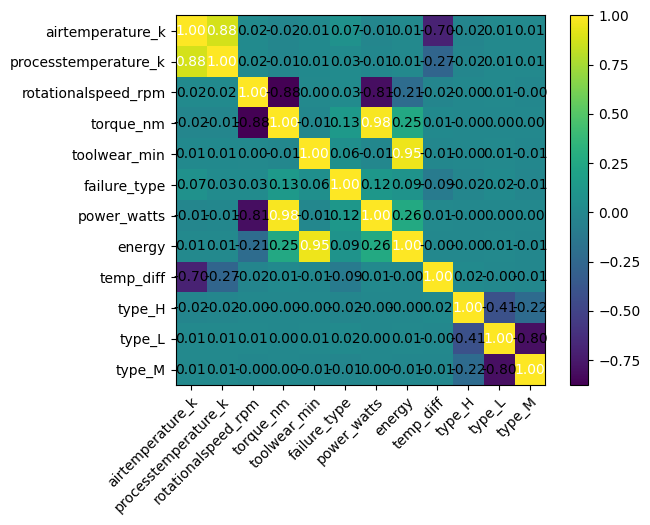

In [ ]:
variables = ['airtemperature_k', 'processtemperature_k', 'rotationalspeed_rpm',
       'torque_nm', 'toolwear_min', 'failure_type', 'power_watts', 'energy',
       'temp_diff', 'type_H', 'type_L', 'type_M']
cm = df[variables].corr().values
plt.figure(figsize = (20,20))
hm = heatmap(
    cm,
    row_names=variables,
    column_names=variables)

In [ ]:
# PCA
pca = PCA()
X_pca = pca.fit_transform(df)

# Convert to dataframe
component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
X_pca = pd.DataFrame(X_pca, columns=component_names)
X_pca['failure_type'] = df['failure_type']
X_pca.head(10)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,failure_type
0,-6.447856e+06,-10725.474090,102.457474,8.316531,2.419516,-1.915173,-0.214338,0.882123,0.203120,-0.216594,1.153272e-13,-8.997737e-16,0.0
1,-6.252286e+06,-9406.327219,-57.526290,6.160429,2.193660,0.523542,-0.089528,-0.521394,-0.099799,-0.080822,-3.037532e-16,2.048615e-16,0.0
2,-6.077845e+06,-18099.953574,158.172565,20.466320,2.479373,-1.872636,-0.341809,-0.520421,-0.038172,-0.077705,-1.136166e-14,-7.016038e-17,0.0
3,-6.051638e+06,-687.691538,-154.907385,-7.929720,2.172190,0.648648,-0.234700,-0.524459,0.052584,-0.085168,-1.127713e-14,6.020801e-16,0.0
4,-5.940983e+06,-331.637730,-183.926216,-8.204389,2.127971,1.018101,-0.085105,-0.525285,0.034377,-0.085361,-1.126010e-14,-1.044478e-15,0.0
5,-5.791078e+06,-3619.736531,-118.584050,-2.809270,2.298643,0.563391,-0.142256,0.881092,0.105268,-0.219026,-1.129322e-14,-4.749091e-16,0.0
6,-5.523028e+06,-9792.198529,105.078367,6.706128,2.425893,-1.973266,-0.213992,-0.518422,0.101212,-0.082208,-1.132484e-14,6.147741e-16,0.0
7,-5.465693e+06,-5081.526912,7.442452,-0.270036,2.373249,-1.023188,-0.187976,-0.519513,0.096166,-0.084005,-1.128912e-14,6.301764e-16,0.0
8,-5.589697e+06,8546.531517,-48.062589,-19.977459,2.109133,-0.227527,-0.215748,0.897436,0.221947,-0.223005,-1.139892e-14,-7.192011e-17,0.0
9,-5.424160e+06,7585.013870,41.266151,-17.864197,1.863408,-0.650720,0.005041,0.906064,0.177440,-0.221617,-1.132918e-14,1.665850e-14,0.0


<Figure size 1500x1500 with 0 Axes>

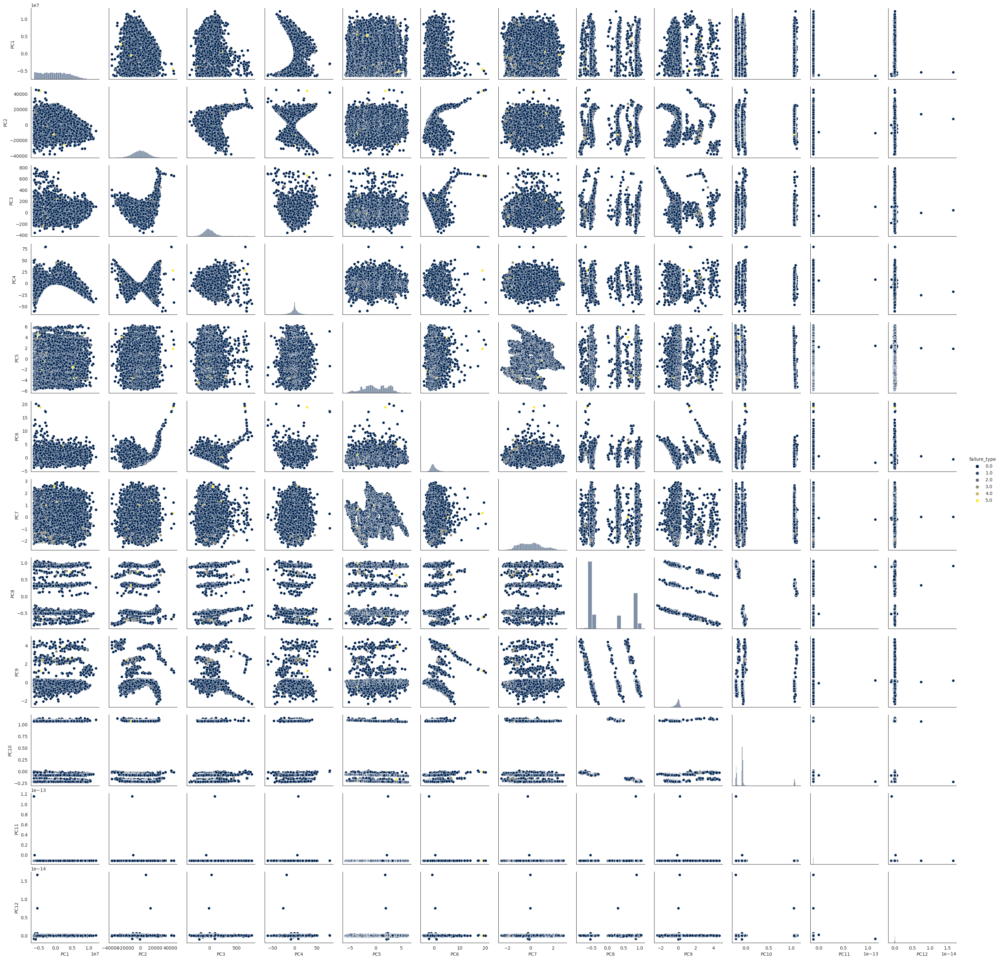

In [ ]:
plt.figure(figsize=(15,15))
sns.set_style('white')
plot_kws={"s": 1}
g = sns.pairplot(
             X_pca,
             # kind='reg',
             diag_kind='hist',
             corner=False,
             # plot_kws=dict(scatter_kws=dict(s=5)),
             palette='cividis',
             hue='failure_type'
            )

# g = g.map_diag(sns.kdeplot, lw=2)
# g = g.map_offdiag(sns.kdeplot, lw=0.5)
plt.show()

All though, there are various failure types, it looks like they are very clustered.

In [ ]:
'''
best_features = SelectKBest(score_func=chi2,k='all')

X = df[['airtemperature_k', 'processtemperature_k', 'rotationalspeed_rpm',
       'torque_nm', 'toolwear_min', 'power_watts', 'energy',
       'temp_diff', 'type_H', 'type_L', 'type_M']]
y = df['failure_type']
fit = best_features.fit(X,y)

df_scores=pd.DataFrame(fit.scores_)
df_col=pd.DataFrame(X.columns)

feature_score=pd.concat([df_col,df_scores],axis=1)
feature_score.columns=['feature','score']
feature_score.sort_values(by=['score'],ascending=True,inplace=True)

fig = go.Figure(go.Bar(
            x=feature_score['score'][0:21],
            y=feature_score['feature'][0:21],
            orientation='h'))

fig.update_layout(title="Top 20 Features",
                  height=1200,
                  showlegend=False,
                 )

fig.show()
'''


'\nbest_features = SelectKBest(score_func=chi2,k=\'all\')\n\nX = df[[\'airtemperature_k\', \'processtemperature_k\', \'rotationalspeed_rpm\',\n       \'torque_nm\', \'toolwear_min\', \'power_watts\', \'energy\',\n       \'temp_diff\', \'type_H\', \'type_L\', \'type_M\']]\ny = df[\'failure_type\']\nfit = best_features.fit(X,y)\n\ndf_scores=pd.DataFrame(fit.scores_)\ndf_col=pd.DataFrame(X.columns)\n\nfeature_score=pd.concat([df_col,df_scores],axis=1)\nfeature_score.columns=[\'feature\',\'score\']\nfeature_score.sort_values(by=[\'score\'],ascending=True,inplace=True)\n\nfig = go.Figure(go.Bar(\n            x=feature_score[\'score\'][0:21],\n            y=feature_score[\'feature\'][0:21],\n            orientation=\'h\'))\n\nfig.update_layout(title="Top 20 Features",\n                  height=1200,\n                  showlegend=False,\n                 )\n\nfig.show()\n'

# **Modeling**

In [ ]:
def get_metrics(y_true, y_pred, model_name):
    # Calculating F1 scores for each class
    f1_scores_per_class_unwgt = f1_score(y_true, y_pred, average='macro')
    f1_scores_per_class_wgt = f1_score(y_true, y_pred, average='weighted')
    mcc_score = matthews_corrcoef(y_true, y_pred)
    precision_score_unwgt = precision_score(y_true, y_pred, average='macro')
    precision_score_wgt = precision_score(y_true, y_pred, average='weighted')
    recall_score_unwgt = recall_score(y_true, y_pred, average='macro')
    recall_score_wgt = recall_score(y_true, y_pred, average='weighted')
    accuracy_score_val = accuracy_score(y_true, y_pred)
    balanced_accuracy_score_val = balanced_accuracy_score(y_true, y_pred)
    f2_score = fbeta_score(y_true, y_pred, beta=2, average='weighted')

    dict_metrics = {
        'Model': model_name,
        'Accuracy': accuracy_score_val,
        'Balanced Accuracy': balanced_accuracy_score_val,
        'Macro Recall': recall_score_unwgt,
        'Macro Precision': precision_score_unwgt,
        'Weighted Recall': recall_score_wgt,
        'Weighted Precision': precision_score_wgt,
        'Macro F1': f1_scores_per_class_unwgt,
        'Weighted F1': f1_scores_per_class_wgt,
        'MCC Score': mcc_score,
        'F2 Score': f2_score
    }
    return dict_metrics

In [ ]:
def plot_confusion_matrix_custom(y_true, y_pred, cls_lbl, title):
    print(title)
    cm = confusion_matrix(y_true, y_pred, labels=cls_lbl)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=cls_lbl)
    disp.plot()
    plt.show()

In [ ]:
X = df[['airtemperature_k',
        'processtemperature_k',
        'rotationalspeed_rpm',
        'torque_nm',
        'toolwear_min',
        'power_watts',
        'energy',
        'temp_diff',
        'type_H',
        'type_L',
        'type_M']]
y = df['failure_type']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2, stratify=y)

# standardize
sc_x = StandardScaler()

X_train_std = sc_x.fit(X_train).transform(X_train)
X_test_std = sc_x.fit(X_train).transform(X_test)

## **Gradient Boost Classifier**

In [ ]:
# Gradient Boost Classifier, Balanced
gbc_1 = GradientBoostingClassifier(random_state=1234)

# Fit pipeline with sample weights
#weights = class_weight.compute_sample_weight(class_weight='balanced', y=y_train)
gbc_1.fit(X_train, y_train)

# Step 1: Generate Predictions
y_pred_gbc_1 = gbc_1.predict(X_test)

# Step 2: Evaluate Metrics
metrics_gbc_1 = get_metrics(y_test, y_pred_gbc_1, 'GradientBoostingClassifier_wo_std')

# Step 3: View Results
metrics_gbc_1

{'Model': 'GradientBoostingClassifier_wo_std',
 'Accuracy': 0.9879759519038076,
 'Balanced Accuracy': 0.6267896702095305,
 'Macro Recall': 0.6267896702095305,
 'Macro Precision': 0.618975161835069,
 'Weighted Recall': 0.9879759519038076,
 'Weighted Precision': 0.984040625579896,
 'Macro F1': 0.6227979782649203,
 'Weighted F1': 0.9859998447549376,
 'MCC Score': 0.8024123443439788,
 'F2 Score': 0.9871834323341403}

Confusion Matrix for GradientBoostingClassifier


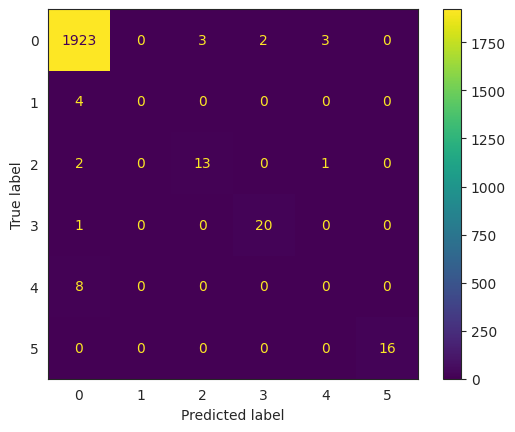

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_gbc_1, gbc_1.classes_, title = 'Confusion Matrix for GradientBoostingClassifier')

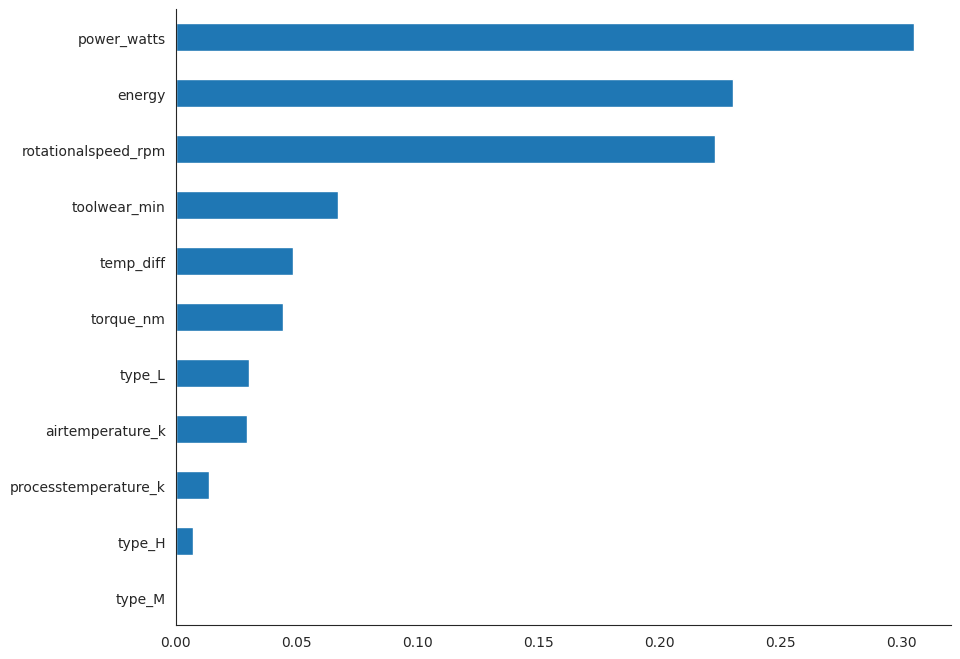

In [ ]:
plt.rcParams['figure.figsize']=10,8
sns.set_style("white")
feat_importances = pd.Series(gbc_1.feature_importances_, index=gbc_1.feature_names_in_)
feat_importances = feat_importances.groupby(level=0).mean()
feat_importances.nlargest(20).plot(kind='barh').invert_yaxis()
sns.despine()
plt.show()

In [ ]:
# Gradient Boost Classifier, Balanced
gbc_2 = GradientBoostingClassifier(random_state=1234)

# Fit pipeline with sample weights
#weights = class_weight.compute_sample_weight(class_weight='balanced', y=y_train)
gbc_2.fit(X_train_std, y_train)

# Step 1: Generate Predictions
y_pred_gbc_2 = gbc_2.predict(X_test_std)

# Step 2: Evaluate Metrics
metrics_gbc_2 = get_metrics(y_test, y_pred_gbc_2, 'GradientBoostingClassifier_w_std')

# Step 3: View Results
metrics_gbc_2

{'Model': 'GradientBoostingClassifier_w_std',
 'Accuracy': 0.9879759519038076,
 'Balanced Accuracy': 0.6267896702095305,
 'Macro Recall': 0.6267896702095305,
 'Macro Precision': 0.618975161835069,
 'Weighted Recall': 0.9879759519038076,
 'Weighted Precision': 0.984040625579896,
 'Macro F1': 0.6227979782649203,
 'Weighted F1': 0.9859998447549376,
 'MCC Score': 0.8024123443439788,
 'F2 Score': 0.9871834323341403}

Confusion Matrix for GradientBoostingClassifier Using Standardization


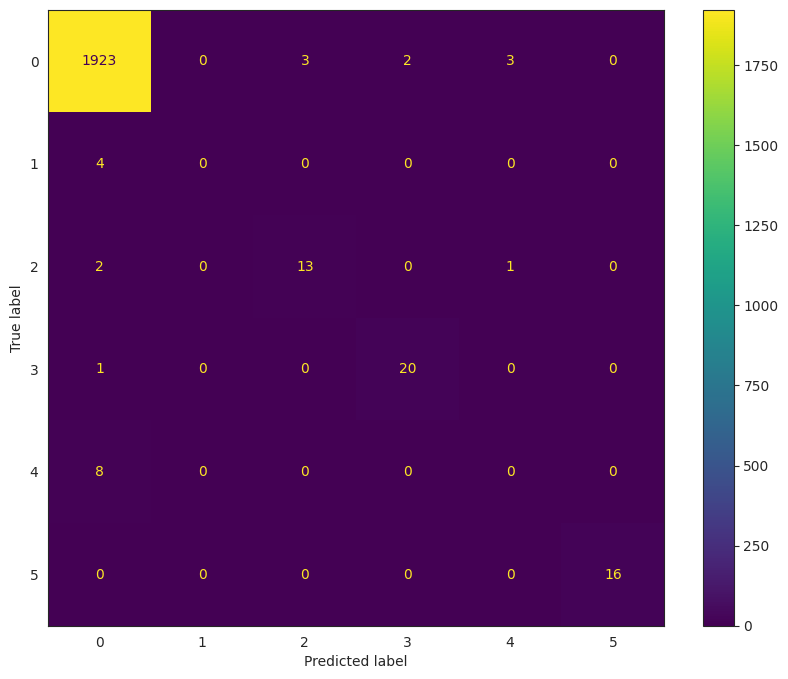

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_gbc_2, gbc_2.classes_, title = 'Confusion Matrix for GradientBoostingClassifier Using Standardization')

With and without standardization, did not find much differrence.

In [ ]:
print(classification_report(y_test, y_pred_gbc_1))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1931
           1       0.00      0.00      0.00         4
           2       0.81      0.81      0.81        16
           3       0.91      0.95      0.93        21
           4       0.00      0.00      0.00         8
           5       1.00      1.00      1.00        16

    accuracy                           0.99      1996
   macro avg       0.62      0.63      0.62      1996
weighted avg       0.98      0.99      0.99      1996



In [ ]:
print(classification_report(y_test, y_pred_gbc_2))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1931
           1       0.00      0.00      0.00         4
           2       0.81      0.81      0.81        16
           3       0.91      0.95      0.93        21
           4       0.00      0.00      0.00         8
           5       1.00      1.00      1.00        16

    accuracy                           0.99      1996
   macro avg       0.62      0.63      0.62      1996
weighted avg       0.98      0.99      0.99      1996



## **Random Forest Classifier**

In [ ]:
# Random Forest Classifier, Balanced
rf_1 = RandomForestClassifier(random_state=1234)

# Fit pipeline with sample weights
rf_1.fit(X_train, y_train)

# Step 1: Generate Predictions
y_pred_rf_1 = rf_1.predict(X_test)

# Step 2: Evaluate Metrics
metrics_rf_1 = get_metrics(y_test, y_pred_rf_1, 'RandomForestClassifier_wo_std')

# Step 3: View Results
metrics_rf_1

{'Model': 'RandomForestClassifier_wo_std',
 'Accuracy': 0.9904809619238477,
 'Balanced Accuracy': 0.6218511873936524,
 'Macro Recall': 0.6218511873936524,
 'Macro Precision': 0.645327647656311,
 'Weighted Recall': 0.9904809619238477,
 'Weighted Precision': 0.9844484510030862,
 'Macro F1': 0.6330541850061432,
 'Weighted F1': 0.987419022107383,
 'MCC Score': 0.839293473691507,
 'F2 Score': 0.9892457343182393}

Confusion Matrix for RandomForestClassifier


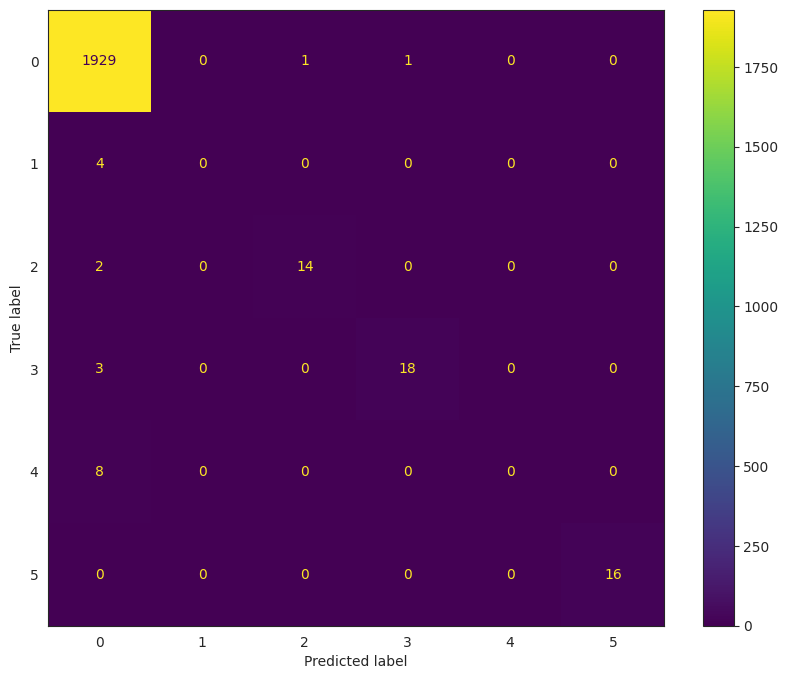

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_rf_1, rf_1.classes_, title = 'Confusion Matrix for RandomForestClassifier')

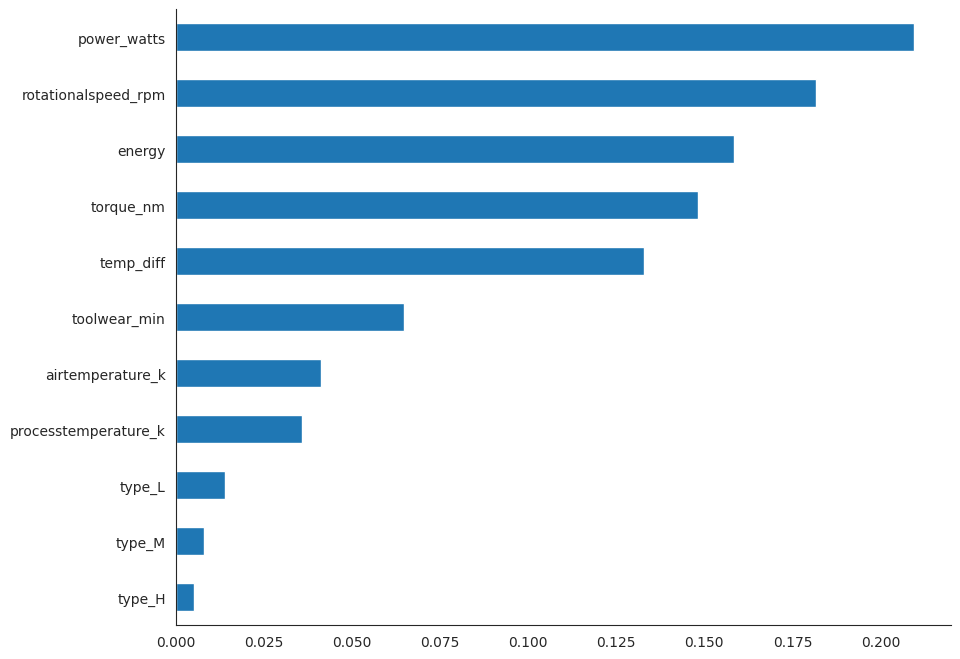

In [ ]:
plt.rcParams['figure.figsize']=10,8
sns.set_style("white")
feat_importances = pd.Series(rf_1.feature_importances_, index=rf_1.feature_names_in_)
feat_importances = feat_importances.groupby(level=0).mean()
feat_importances.nlargest(20).plot(kind='barh').invert_yaxis()
sns.despine()
plt.show()

In [ ]:
# Random Forest Classifier, Balanced
rf_2 = RandomForestClassifier(random_state=1234)

# Fit pipeline with sample weights
rf_2.fit(X_train_std, y_train)

# Step 1: Generate Predictions
y_pred_rf_2 = rf_1.predict(X_test_std)

# Step 2: Evaluate Metrics
metrics_rf_2 = get_metrics(y_test, y_pred_rf_2, 'RandomForestClassifier_w_std')

# Step 3: View Results
metrics_rf_2

{'Model': 'RandomForestClassifier_w_std',
 'Accuracy': 0.008016032064128256,
 'Balanced Accuracy': 0.16666666666666666,
 'Macro Recall': 0.16666666666666666,
 'Macro Precision': 0.001336005344021376,
 'Weighted Recall': 0.008016032064128256,
 'Weighted Precision': 6.42567700531323e-05,
 'Macro F1': 0.002650762094102054,
 'Weighted F1': 0.00012749156364418696,
 'MCC Score': 0.0,
 'F2 Score': 0.0003113022160826507}

Confusion Matrix for RandomForestClassifier With Standardization


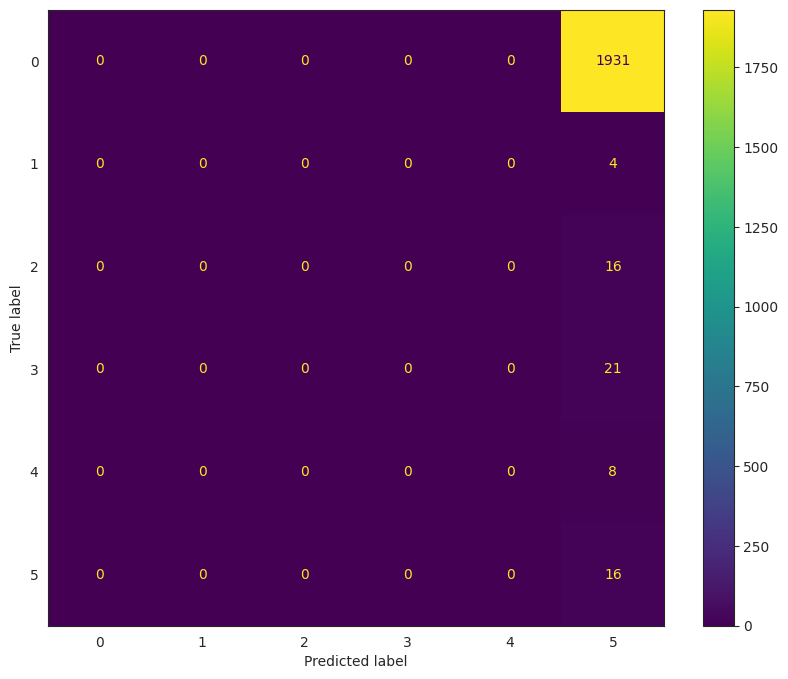

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_rf_2, rf_2.classes_, title = 'Confusion Matrix for RandomForestClassifier With Standardization')

With standardization, the performance was poor.

In [ ]:
print(classification_report(y_test, y_pred_rf_1))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1931
           1       0.00      0.00      0.00         4
           2       0.93      0.88      0.90        16
           3       0.95      0.86      0.90        21
           4       0.00      0.00      0.00         8
           5       1.00      1.00      1.00        16

    accuracy                           0.99      1996
   macro avg       0.65      0.62      0.63      1996
weighted avg       0.98      0.99      0.99      1996



In [ ]:
print(classification_report(y_test, y_pred_rf_2))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1931
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00        16
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00         8
           5       0.01      1.00      0.02        16

    accuracy                           0.01      1996
   macro avg       0.00      0.17      0.00      1996
weighted avg       0.00      0.01      0.00      1996



## **KNN Classifier**

In [ ]:
knn_1 = KNeighborsClassifier(n_neighbors=5).fit(X_train,y_train)
y_pred_knn_1 = knn_1.predict(X_test)
metrics_knn_1 = get_metrics(y_test, y_pred_knn_1, 'KNNClassifier_wo_std')
metrics_knn_1

{'Model': 'KNNClassifier_wo_std',
 'Accuracy': 0.967434869739479,
 'Balanced Accuracy': 0.2183184446746073,
 'Macro Recall': 0.2183184446746073,
 'Macro Precision': 0.24496475327291037,
 'Weighted Recall': 0.967434869739479,
 'Weighted Precision': 0.9422152462023745,
 'Macro F1': 0.22800350870302363,
 'Weighted F1': 0.9544640231937727,
 'MCC Score': 0.19057134225811184,
 'F2 Score': 0.9621723615349386}

Confusion Matrix for KNN Classifier


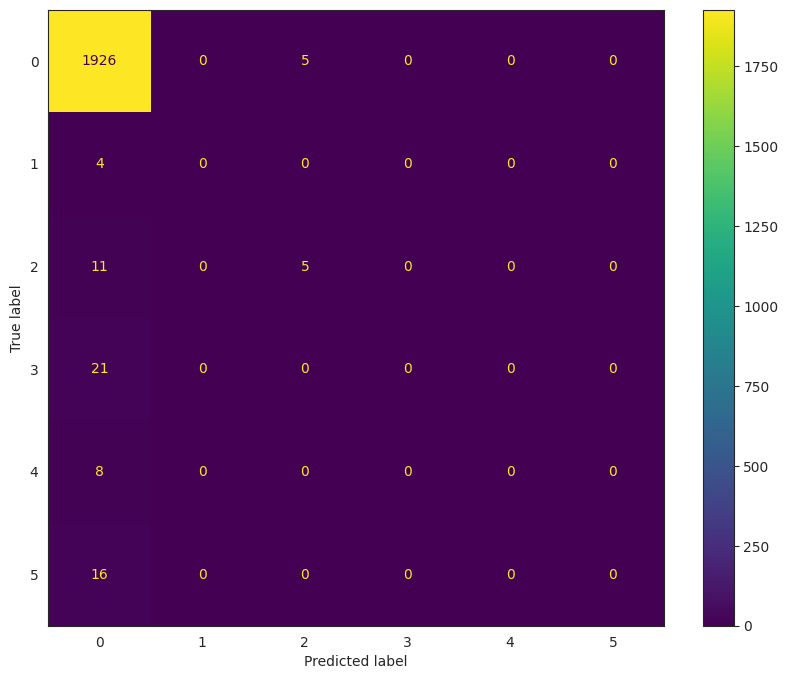

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_knn_1, knn_1.classes_, title = 'Confusion Matrix for KNN Classifier')

In [ ]:
print(classification_report(y_test, y_pred_knn_1))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1931
           1       0.00      0.00      0.00         4
           2       0.50      0.31      0.38        16
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00         8
           5       0.00      0.00      0.00        16

    accuracy                           0.97      1996
   macro avg       0.24      0.22      0.23      1996
weighted avg       0.94      0.97      0.95      1996



## **SVC Classifier**

In [ ]:
svc_1 = SVC().fit(X_train,y_train)
y_pred_svc_1 = svc_1.predict(X_test)
metrics_svc_1 = get_metrics(y_test, y_pred_svc_1, 'SVClassifier_wo_std')
metrics_svc_1

{'Model': 'SVClassifier_wo_std',
 'Accuracy': 0.969939879759519,
 'Balanced Accuracy': 0.22908035560158813,
 'Macro Recall': 0.22908035560158813,
 'Macro Precision': 0.30457995163877516,
 'Weighted Recall': 0.969939879759519,
 'Weighted Precision': 0.9456085913117624,
 'Macro F1': 0.2510721679976338,
 'Weighted F1': 0.9568094707605094,
 'MCC Score': 0.27793894156185744,
 'F2 Score': 0.9645469953658308}

In [ ]:
svc_2 = SVC().fit(X_train_std,y_train)
y_pred_svc_2 = svc_1.predict(X_test_std)
metrics_svc_2 = get_metrics(y_test, y_pred_svc_2, 'SVClassifier_w_std')
metrics_svc_2

{'Model': 'SVClassifier_w_std',
 'Accuracy': 0.967434869739479,
 'Balanced Accuracy': 0.16666666666666666,
 'Macro Recall': 0.16666666666666666,
 'Macro Precision': 0.16123914495657984,
 'Weighted Recall': 0.967434869739479,
 'Weighted Precision': 0.9359302271878427,
 'Macro F1': 0.1639079874373992,
 'Weighted F1': 0.9514218148545627,
 'MCC Score': 0.0,
 'F2 Score': 0.9609653978739373}

Confusion Matrix for Support Vector Classifier


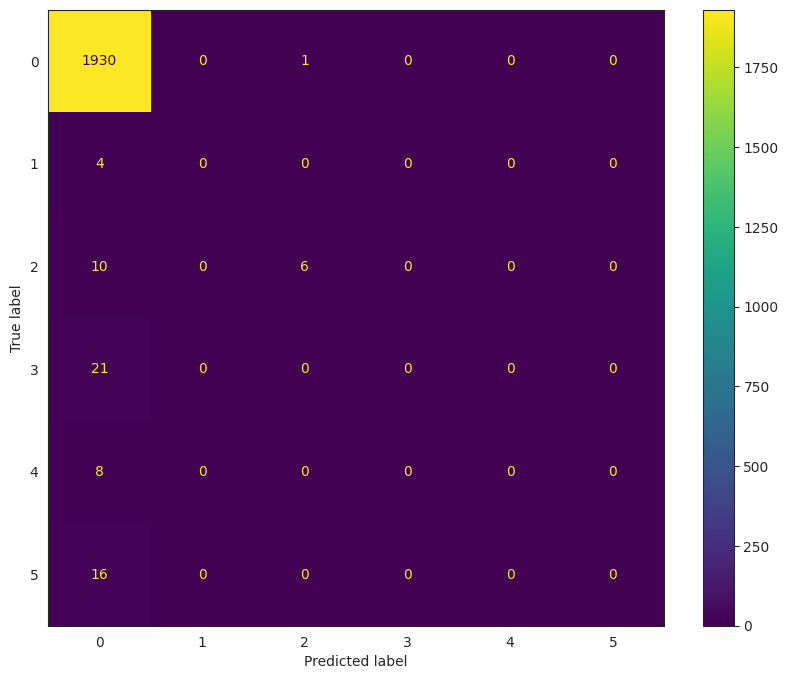

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_svc_1, svc_1.classes_, title = 'Confusion Matrix for Support Vector Classifier')

With standardization, the performance was poor.

In [ ]:
print(classification_report(y_test, y_pred_svc_1))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1931
           1       0.00      0.00      0.00         4
           2       0.86      0.38      0.52        16
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00         8
           5       0.00      0.00      0.00        16

    accuracy                           0.97      1996
   macro avg       0.30      0.23      0.25      1996
weighted avg       0.95      0.97      0.96      1996



In [ ]:
print(classification_report(y_test, y_pred_svc_2))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1931
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00        16
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00         8
           5       0.00      0.00      0.00        16

    accuracy                           0.97      1996
   macro avg       0.16      0.17      0.16      1996
weighted avg       0.94      0.97      0.95      1996



## **Decission Tree Classifier**

In [ ]:
dt_1 = DecisionTreeClassifier().fit(X_train,y_train)
y_pred_dt_1 = dt_1.predict(X_test)
metrics_dt_1 = get_metrics(y_test, y_pred_dt_1, 'DecisionTreeClassifier_wo_std')
metrics_dt_1

{'Model': 'DecisionTreeClassifier_wo_std',
 'Accuracy': 0.9869739478957916,
 'Balanced Accuracy': 0.6394275624111202,
 'Macro Recall': 0.6394275624111202,
 'Macro Precision': 0.6292635658914728,
 'Weighted Recall': 0.9869739478957916,
 'Weighted Precision': 0.9846264233894144,
 'Macro F1': 0.6337428186673456,
 'Weighted F1': 0.9857687937314128,
 'MCC Score': 0.7899525734029228,
 'F2 Score': 0.9864838303022961}

Confusion Matrix for Decision Tree Classifier


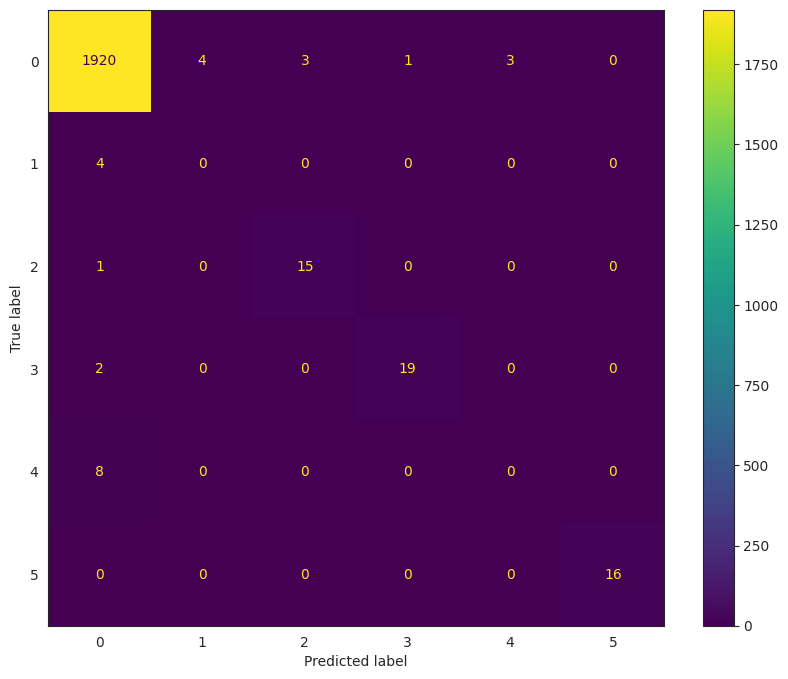

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_dt_1, dt_1.classes_, title = 'Confusion Matrix for Decision Tree Classifier')

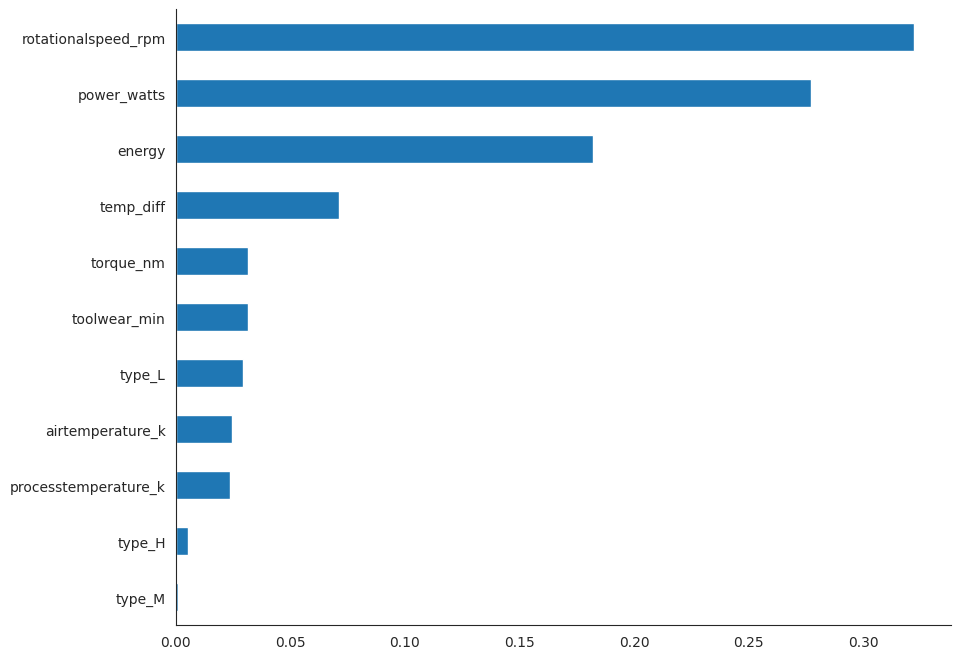

In [ ]:
plt.rcParams['figure.figsize']=10,8
sns.set_style("white")
feat_importances = pd.Series(dt_1.feature_importances_, index=dt_1.feature_names_in_)
feat_importances = feat_importances.groupby(level=0).mean()
feat_importances.nlargest(20).plot(kind='barh').invert_yaxis()
sns.despine()
plt.show()

In [ ]:
print(classification_report(y_test, y_pred_dt_1))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1931
           1       0.00      0.00      0.00         4
           2       0.83      0.94      0.88        16
           3       0.95      0.90      0.93        21
           4       0.00      0.00      0.00         8
           5       1.00      1.00      1.00        16

    accuracy                           0.99      1996
   macro avg       0.63      0.64      0.63      1996
weighted avg       0.98      0.99      0.99      1996



## **Logistic Regression**

In [ ]:
lr_1 = LogisticRegression().fit(X_train,y_train)
y_pred_lr_1 = lr_1.predict(X_test)
metrics_lr_1 = get_metrics(y_test, y_pred_lr_1, 'LogisticRegressionClassifier_wo_std')
metrics_lr_1

{'Model': 'LogisticRegressionClassifier_wo_std',
 'Accuracy': 0.967434869739479,
 'Balanced Accuracy': 0.16666666666666666,
 'Macro Recall': 0.16666666666666666,
 'Macro Precision': 0.16123914495657984,
 'Weighted Recall': 0.967434869739479,
 'Weighted Precision': 0.9359302271878427,
 'Macro F1': 0.1639079874373992,
 'Weighted F1': 0.9514218148545627,
 'MCC Score': 0.0,
 'F2 Score': 0.9609653978739373}

Confusion Matrix for Logistic Regression Classifier


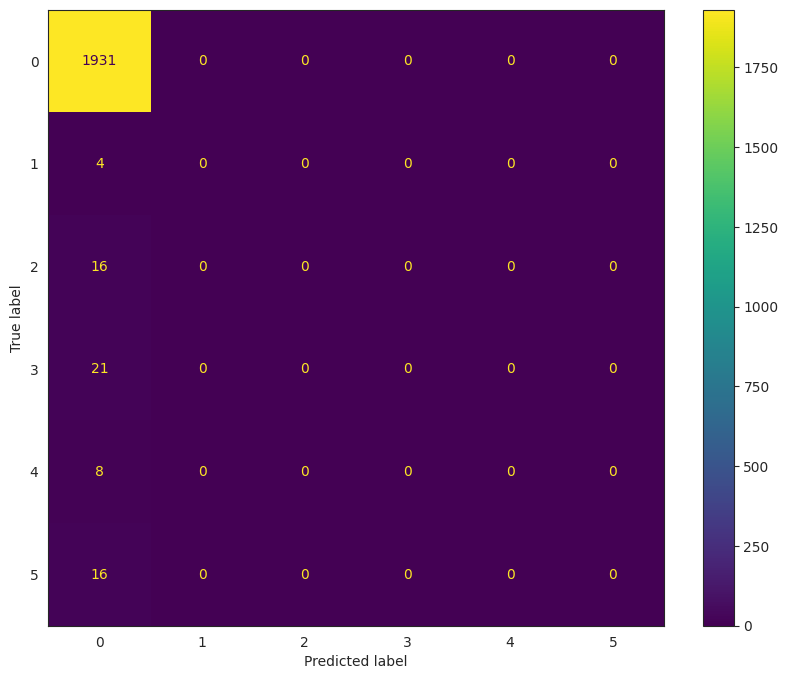

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_lr_1, lr_1.classes_, title = 'Confusion Matrix for Logistic Regression Classifier')

In [ ]:
print(classification_report(y_test, y_pred_lr_1))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1931
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00        16
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00         8
           5       0.00      0.00      0.00        16

    accuracy                           0.97      1996
   macro avg       0.16      0.17      0.16      1996
weighted avg       0.94      0.97      0.95      1996



## **MLP Classifier**

In [ ]:
mlpc_1 = MLPClassifier(hidden_layer_sizes = (5,5,5),
                      activation='relu',
                      solver='adam',
                      batch_size=32,
                      verbose=0).fit(X_train,y_train)
y_pred_mlpc_1 = mlpc_1.predict(X_test)
metrics_mlpc_1 = get_metrics(y_test, y_pred_mlpc_1, 'MLPClassifier_wo_std')
metrics_mlpc_1

{'Model': 'MLPClassifier_wo_std',
 'Accuracy': 0.9649298597194389,
 'Balanced Accuracy': 0.16623511134127394,
 'Macro Recall': 0.16623511134127394,
 'Macro Precision': 0.16122551481667505,
 'Weighted Recall': 0.9649298597194389,
 'Weighted Precision': 0.9358511095521026,
 'Macro F1': 0.1636919938806731,
 'Weighted F1': 0.9501680566640675,
 'MCC Score': -0.005690913569193998,
 'F2 Score': 0.9589704370140177}

In [ ]:
mlpc_2 = MLPClassifier(hidden_layer_sizes = (5,5,5),
                      activation='relu',
                      solver='adam',
                      batch_size=32,
                      verbose=0).fit(X_train_std,y_train)
y_pred_mlpc_2 = mlpc_2.predict(X_test_std)
metrics_mlpc_2 = get_metrics(y_test, y_pred_mlpc_2, 'MLPClassifier_w_std')
metrics_mlpc_2

{'Model': 'MLPClassifier_w_std',
 'Accuracy': 0.9754509018036072,
 'Balanced Accuracy': 0.3746547557396858,
 'Macro Recall': 0.3746547557396858,
 'Macro Precision': 0.4359217171717171,
 'Weighted Recall': 0.9754509018036072,
 'Weighted Precision': 0.9603971199975709,
 'Macro F1': 0.40058813696321693,
 'Weighted F1': 0.9676125451747146,
 'MCC Score': 0.5099129304458516,
 'F2 Score': 0.9722528459931765}

Confusion Matrix for MLP Classifier


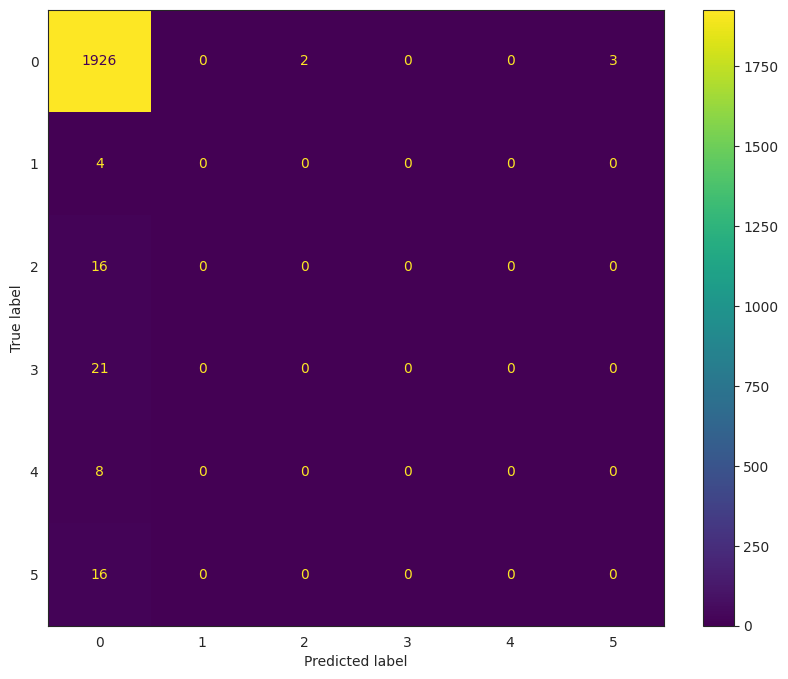

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_mlpc_1, mlpc_1.classes_, title = 'Confusion Matrix for MLP Classifier')

Confusion Matrix for MLP Classifier with Standardization


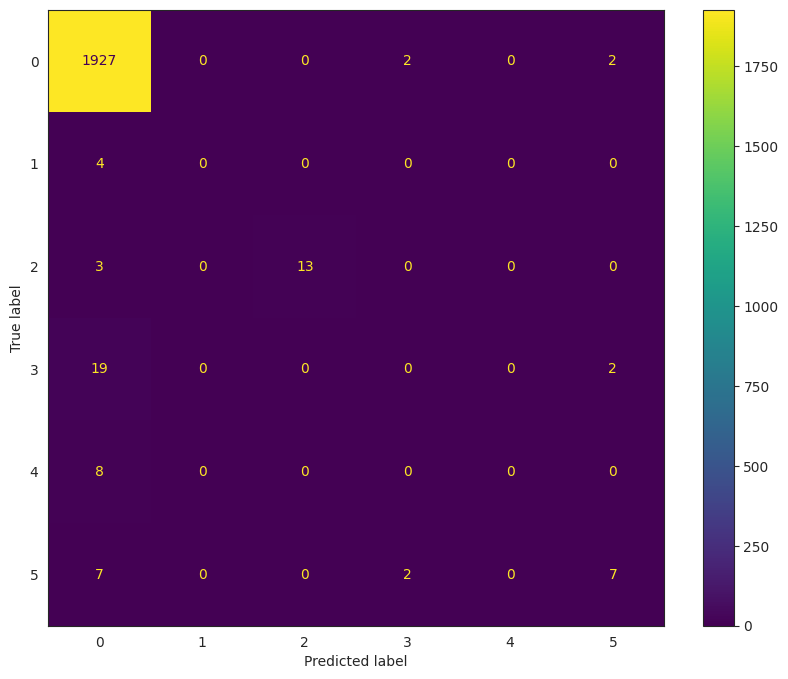

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_mlpc_2, mlpc_2.classes_, title = 'Confusion Matrix for MLP Classifier with Standardization')

In [ ]:
print(classification_report(y_test, y_pred_mlpc_1))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1931
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00        16
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00         8
           5       0.00      0.00      0.00        16

    accuracy                           0.96      1996
   macro avg       0.16      0.17      0.16      1996
weighted avg       0.94      0.96      0.95      1996



In [ ]:
print(classification_report(y_test, y_pred_mlpc_2))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1931
           1       0.00      0.00      0.00         4
           2       1.00      0.81      0.90        16
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00         8
           5       0.64      0.44      0.52        16

    accuracy                           0.98      1996
   macro avg       0.44      0.37      0.40      1996
weighted avg       0.96      0.98      0.97      1996



## **XGBoost Classifier**

In [ ]:
xgbc_1 = xgb.XGBClassifier()
xgbc_1.fit(X_train, y_train)
y_pred_xgbc_1 = xgbc_1.predict(X_test)
metrics_xgbc_1 = get_metrics(y_test, y_pred_xgbc_1, 'XGBClassifier_wo_std')
metrics_xgbc_1

{'Model': 'XGBClassifier_wo_std',
 'Accuracy': 0.9904809619238477,
 'Balanced Accuracy': 0.6193710286634937,
 'Macro Recall': 0.6193710286634937,
 'Macro Precision': 0.6457662441475391,
 'Weighted Recall': 0.9904809619238477,
 'Weighted Precision': 0.9844761379559392,
 'Macro F1': 0.6321493856355689,
 'Weighted F1': 0.9874427122886897,
 'MCC Score': 0.839288195058052,
 'F2 Score': 0.9892572829967499}

Confusion Matrix for XGB Classifier without Standardization


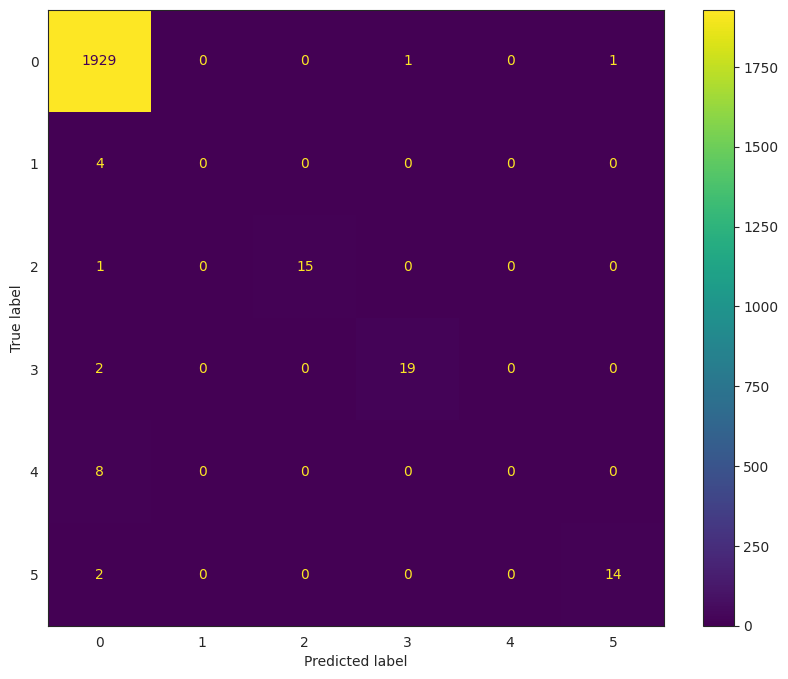

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_xgbc_1, xgbc_1.classes_, title = 'Confusion Matrix for XGB Classifier without Standardization')

In [ ]:
print(classification_report(y_test, y_pred_xgbc_1))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1931
           1       0.00      0.00      0.00         4
           2       1.00      0.94      0.97        16
           3       0.95      0.90      0.93        21
           4       0.00      0.00      0.00         8
           5       0.93      0.88      0.90        16

    accuracy                           0.99      1996
   macro avg       0.65      0.62      0.63      1996
weighted avg       0.98      0.99      0.99      1996



## **LightGBM Classifier**

In [ ]:
lgbc_1 = lgb.LGBMClassifier()
lgbc_1.fit(X_train, y_train)
y_pred_lgbc_1 = lgbc_1.predict(X_test)
metrics_lgbc_1 = get_metrics(y_test, y_pred_lgbc_1, 'LGBClassifier_wo_std')
metrics_lgbc_1

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000954 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1519
[LightGBM] [Info] Number of data points in the train set: 7980, number of used features: 11
[LightGBM] [Info] Start training from score -0.032995
[LightGBM] [Info] Start training from score -6.345636
[LightGBM] [Info] Start training from score -4.857559
[LightGBM] [Info] Start training from score -4.542042
[LightGBM] [Info] Start training from score -5.458333
[LightGBM] [Info] Start training from score -4.825811
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

{'Model': 'LGBClassifier_wo_std',
 'Accuracy': 0.9914829659318637,
 'Balanced Accuracy': 0.6559047557396859,
 'Macro Recall': 0.6559047557396859,
 'Macro Precision': 0.636614642993509,
 'Weighted Recall': 0.9914829659318637,
 'Weighted Precision': 0.9861134927357579,
 'Macro F1': 0.6457141400864143,
 'Weighted F1': 0.9887668265855338,
 'MCC Score': 0.8593543048880279,
 'F2 Score': 0.9903883555048232}

Confusion Matrix for LGB Classifier without Standardization


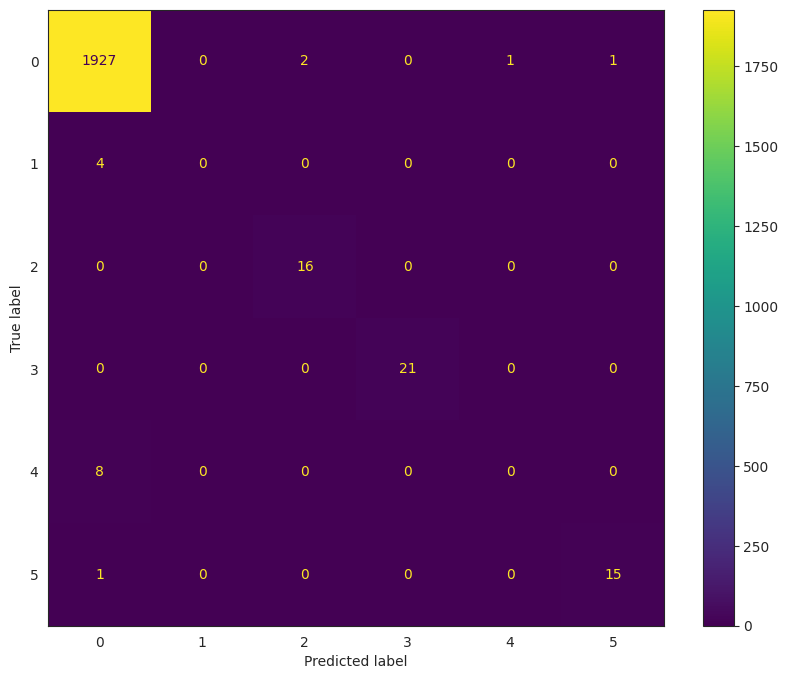

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_lgbc_1, lgbc_1.classes_, title = 'Confusion Matrix for LGB Classifier without Standardization')

In [ ]:
print(classification_report(y_test, y_pred_lgbc_1))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1931
           1       0.00      0.00      0.00         4
           2       0.89      1.00      0.94        16
           3       1.00      1.00      1.00        21
           4       0.00      0.00      0.00         8
           5       0.94      0.94      0.94        16

    accuracy                           0.99      1996
   macro avg       0.64      0.66      0.65      1996
weighted avg       0.99      0.99      0.99      1996



## **Decision Tree Classifier with Over Sampling**

In [ ]:
oversample = RandomOverSampler(random_state=1234)
X_train_ov_smpl, y_train_ov_smpl = oversample.fit_resample(X_train, y_train)
dt_2 = DecisionTreeClassifier().fit(X_train_ov_smpl, y_train_ov_smpl)
y_pred_dt_2 = dt_2.predict(X_test)
metrics_dt_2 = get_metrics(y_test, y_pred_dt_2, 'DecisionTreeClassifier_w_ov_smpl')
metrics_dt_2

{'Model': 'DecisionTreeClassifier_w_ov_smpl',
 'Accuracy': 0.9869739478957916,
 'Balanced Accuracy': 0.611002965401593,
 'Macro Recall': 0.611002965401593,
 'Macro Precision': 0.6979316213849085,
 'Weighted Recall': 0.9869739478957916,
 'Weighted Precision': 0.9839739885546209,
 'Macro F1': 0.635171754347983,
 'Weighted F1': 0.9849820337796182,
 'MCC Score': 0.7797542756693632,
 'F2 Score': 0.9861360356373832}

Confusion Matrix for Decision Tree Classifier with Over Sampling


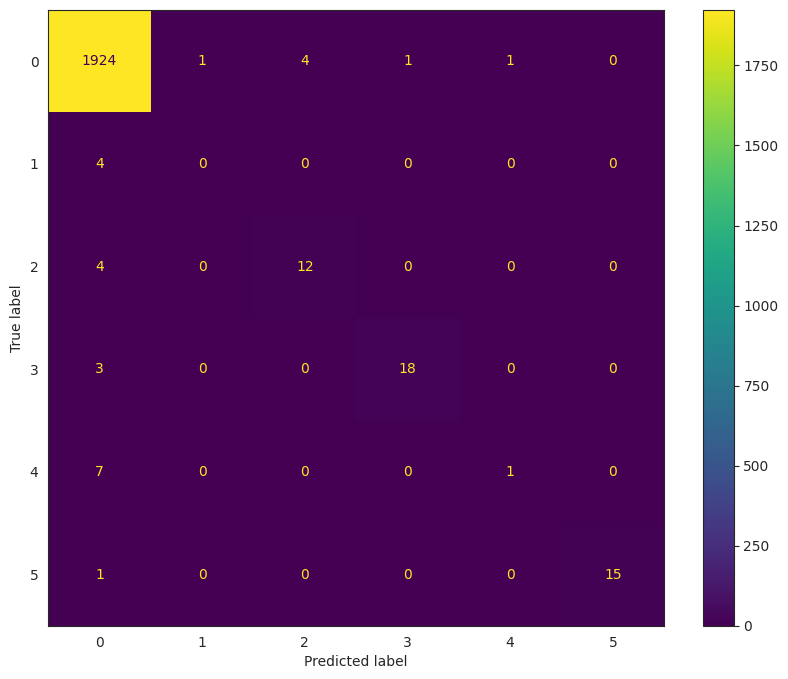

In [ ]:
plot_confusion_matrix_custom(y_test, y_pred_dt_2, dt_2.classes_, title = 'Confusion Matrix for Decision Tree Classifier with Over Sampling')

In [ ]:
print(classification_report(y_test, y_pred_dt_2))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1931
           1       0.00      0.00      0.00         4
           2       0.75      0.75      0.75        16
           3       0.95      0.86      0.90        21
           4       0.50      0.12      0.20         8
           5       1.00      0.94      0.97        16

    accuracy                           0.99      1996
   macro avg       0.70      0.61      0.64      1996
weighted avg       0.98      0.99      0.98      1996



# **Models Comparison**

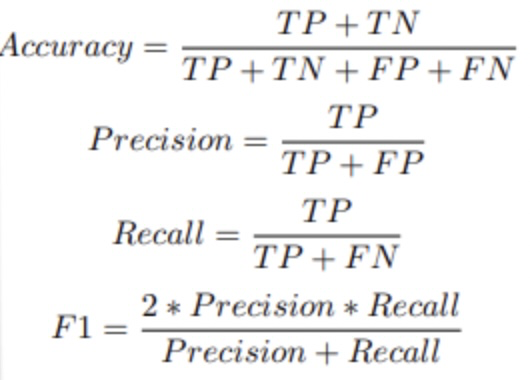

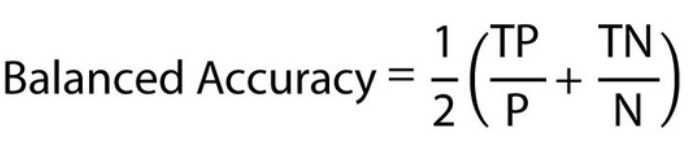

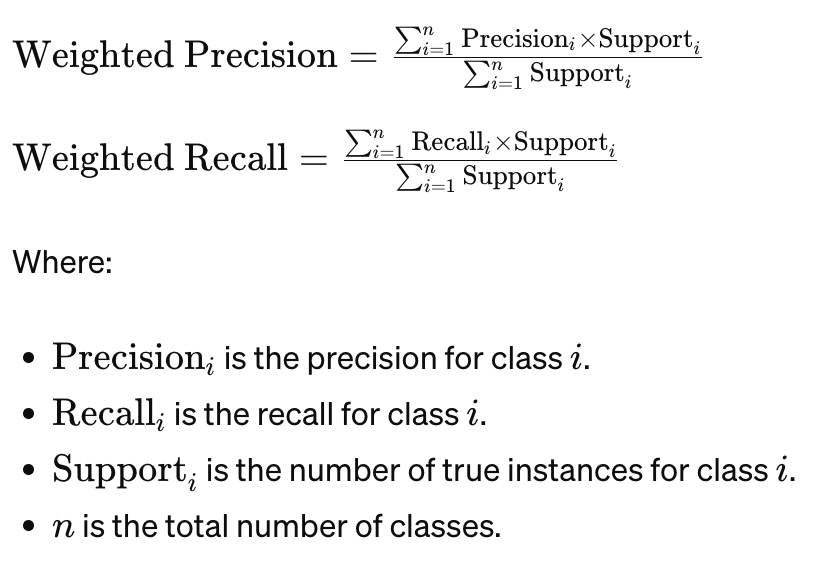

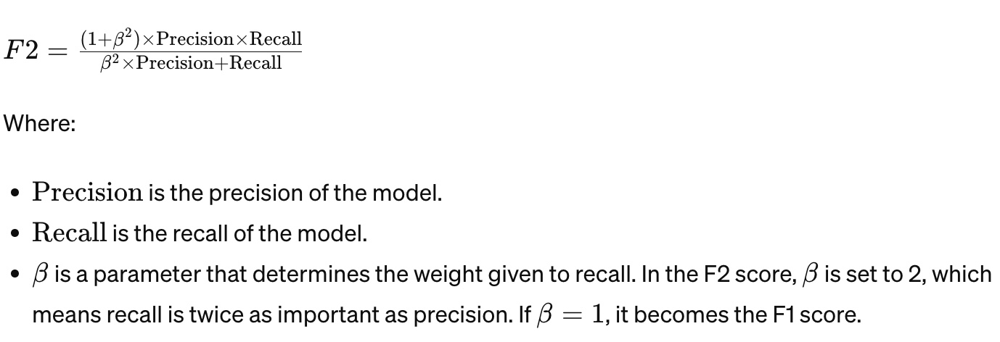

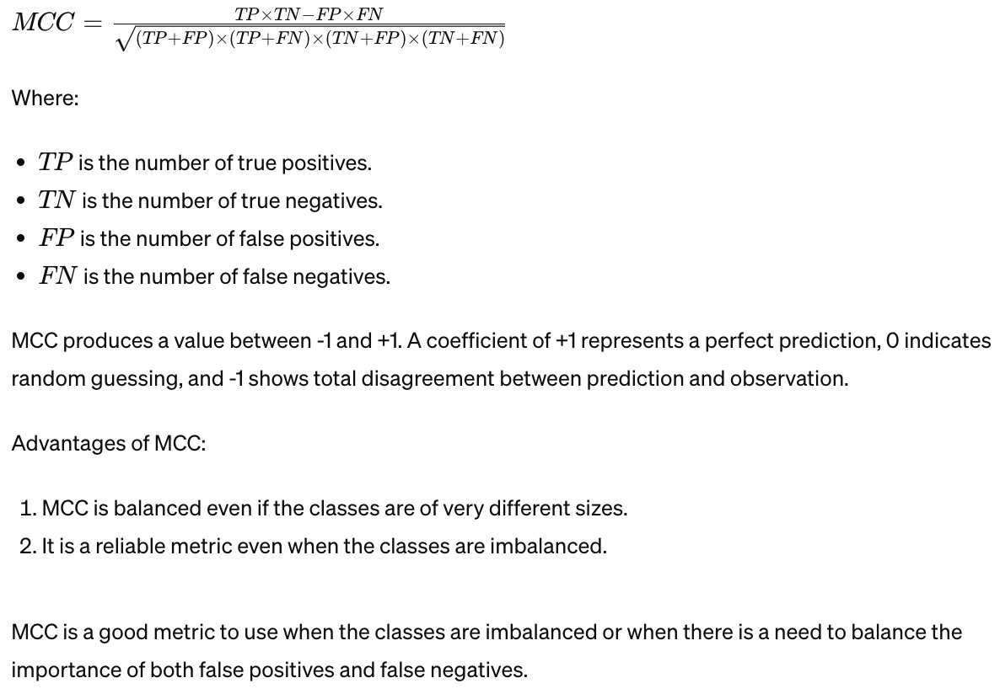

In [ ]:
pd.DataFrame({'metrics_gbc_1':pd.Series(metrics_gbc_1),
              'metrics_gbc_2':pd.Series(metrics_gbc_2),
              'metrics_dt_1':pd.Series(metrics_dt_1),
              'metrics_svc_1':pd.Series(metrics_svc_1),
              'metrics_svc_2':pd.Series(metrics_svc_2),
              'metrics_rf_1':pd.Series(metrics_rf_1),
              'metrics_rf_2':pd.Series(metrics_rf_2),
              'metrics_lr_1':pd.Series(metrics_lr_1),
              'metrics_mlpc_1':pd.Series(metrics_mlpc_1),
              'metrics_mlpc_2':pd.Series(metrics_mlpc_2),
              'metrics_xgbc_1':pd.Series(metrics_xgbc_1),
              'metrics_lgbc_1':pd.Series(metrics_lgbc_1),
              'metrics_dt_2':pd.Series(metrics_dt_2)
             }
            ).iloc[1:,:].T

,Accuracy,Balanced Accuracy,Macro Recall,Macro Precision,Weighted Recall,Weighted Precision,Macro F1,Weighted F1,MCC Score,F2 Score
metrics_gbc_1,0.987976,0.62679,0.62679,0.618975,0.987976,0.984041,0.622798,0.986,0.802412,0.987183
metrics_gbc_2,0.987976,0.62679,0.62679,0.618975,0.987976,0.984041,0.622798,0.986,0.802412,0.987183
metrics_dt_1,0.986974,0.639428,0.639428,0.629264,0.986974,0.984626,0.633743,0.985769,0.789953,0.986484
metrics_svc_1,0.96994,0.22908,0.22908,0.30458,0.96994,0.945609,0.251072,0.956809,0.277939,0.964547
metrics_svc_2,0.967435,0.166667,0.166667,0.161239,0.967435,0.93593,0.163908,0.951422,0.0,0.960965
metrics_rf_1,0.990481,0.621851,0.621851,0.645328,0.990481,0.984448,0.633054,0.987419,0.839293,0.989246
metrics_rf_2,0.008016,0.166667,0.166667,0.001336,0.008016,0.000064,0.002651,0.000127,0.0,0.000311
metrics_lr_1,0.967435,0.166667,0.166667,0.161239,0.967435,0.93593,0.163908,0.951422,0.0,0.960965
metrics_mlpc_1,0.96493,0.166235,0.166235,0.161226,0.96493,0.935851,0.163692,0.950168,-0.005691,0.95897
metrics_mlpc_2,0.975451,0.374655,0.374655,0.435922,0.975451,0.960397,0.400588,0.967613,0.509913,0.972253


# **Conclusions**

The data set is heavily imbalanced. The bulk of the prediction lays with the Random forest and XGBoost, LightGBM classifier seem to be the go-to models for this case, giving even a decent MCC score.